# Optuna Tuning | SGDClassifier
**SGDClassifier** hyper-parameter tuning for the [UCI dataset](https://archive.ics.uci.edu/dataset/296/diabetes+130-us+hospitals+for+years+1999-2008). The dataset represents ten years (1999-2008) of clinical care at 130 US hospitals and integrated delivery networks.

> **[CAUTION]** Do <u>NOT</u> execute "Run All", that will tell Optuna to run hyper-parameter tuning, regardless of whether you have already done it or not. Avoid running the _"Hyper-parameter tuning"_ subsections if you don't have to.

## **0. Initial Setup**
Taking care of package imports, defining work constants, and loading all necessary datasets.

### 0.1 Python imports

In [1]:
# Data Analysis
import numpy as np
import pandas as pd

# Hyperparameter optimization
import optuna

# Machine learning
import os

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Visualization configurations
pd.set_option('display.max_columns', 60)
plt.style.use('ggplot')
sns.set_style('white')

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from collections import Counter

from imblearn.combine import SMOTETomek
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, TomekLinks

from optuna.storages import JournalStorage
from optuna.storages.journal import JournalFileBackend


from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, fbeta_score, make_scorer, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import SGDClassifier

### 0.2 Constants

In [3]:
DATA_PATH = '../data/original/'
DATA_PATH_PROCESSED = '../data/processed/'

MODEL_NAME = 'sgd' # Modify this to the model you are using

OPTUNA_PATH = '../optuna/'
OPTUNA_DIR = OPTUNA_PATH + MODEL_NAME + '/'

STUDY_NAME = "Diabetes_130-US"
STUDY_PATH_NONE = OPTUNA_DIR + f"optuna_{MODEL_NAME}_none.log"
STUDY_PATH_RUS = OPTUNA_DIR + f"optuna_{MODEL_NAME}_rus.log"
STUDY_PATH_SMOTE = OPTUNA_DIR + f"optuna_{MODEL_NAME}_smote.log"
STUDY_PATH_SMOTE_TOMEK = OPTUNA_DIR + f"optuna_{MODEL_NAME}_smote-tomek.log"

# Ensure the directories exist
os.makedirs(OPTUNA_DIR, exist_ok=True)
os.makedirs(os.path.dirname(STUDY_PATH_NONE), exist_ok=True)

N_TRIALS = 100
RANDOM_STATE = 38

SCORE_NAME = 'F1-Score'
SCORING = make_scorer(fbeta_score, beta=1, average='macro')

### 0.3 Loading datasets

In [4]:
train_set = pd.read_csv(
    DATA_PATH_PROCESSED + 'train.csv',
    na_values='?',
    keep_default_na=False
)

test_set = pd.read_csv(
    DATA_PATH_PROCESSED + 'test.csv',
    na_values='?',
    keep_default_na=False
)

## **1. Feature Scaling**
Applying scaling to numerical features.

In [5]:
target = 'readmitted'

X_train = train_set.drop(target, axis=1)
y_train = train_set[target]

X_test = test_set.drop(target, axis=1)
y_test = test_set[target]

### 1.1 Scaling
Applying scaling to numerical features, while leaving boolean features untouched.

In [6]:
NUMERICAL_COLUMNS = [
    'age', 'time_in_hospital', 'num_medications',
    'num_emergency', 'num_inpatient', 'num_diagnoses'
]

In [7]:
scaler = StandardScaler()

X_train[NUMERICAL_COLUMNS] = scaler.fit_transform(X_train[NUMERICAL_COLUMNS])
X_test[NUMERICAL_COLUMNS] = scaler.transform(X_test[NUMERICAL_COLUMNS])

In [8]:
print('Train set:', Counter(y_train))
print('Test set:', Counter(y_test))

Train set: Counter({0: 45522, 1: 4523})
Test set: Counter({0: 19510, 1: 1938})


## **2. Optuna Hyper-parameter Tuning | No under/oversampling**
Hyper-parameter tuning of the model using Optuna, with no undersampling/oversampling.

### 2.1 Objective & study setup
Preparing the objective function with all hyper-parameters, and creating/loading the Optuna study.

In [9]:
def objective(trial: optuna.Trial) -> float:
    # Hyperparameter search space
    penalty = trial.suggest_categorical("penalty", ["l1", "l2", "elasticnet"])
    params = {
        "loss": trial.suggest_categorical(
            "loss", [
                "hinge",
                "log_loss",
                "modified_huber",
                "squared_hinge",
                "perceptron"
            ]
        ),
        "penalty": penalty,
        "alpha": trial.suggest_float("alpha", 1e-6, 1e-1, log=True),
        "max_iter": trial.suggest_int("max_iter", 100, 20000),
        "tol": trial.suggest_float("tol", 1e-4, 1e-2, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "optimal", "invscaling", "adaptive"]),
        "eta0": trial.suggest_float("eta0", 1e-4, 1e-1, log=True),
        "early_stopping": True,
        "warm_start": True
    }

    # Add `l1_ratio` only if penalty is "elasticnet"
    if penalty == "elasticnet":
        params["l1_ratio"] = trial.suggest_float("l1_ratio", 0.0, 1.0)
    
    # Define validation folds
    kf = StratifiedKFold(n_splits=5, shuffle=False)
    model = SGDClassifier(**params, random_state=RANDOM_STATE)
    
    # Cross validation
    scores = cross_val_score(model, X_train, y_train, cv=kf, scoring=SCORING)

    print("Cross validation scores: {}".format(scores))
    print("Average score: {}".format(scores.mean()))

    return scores.mean()

In [10]:
# Set up study with name and storage
storage = JournalStorage(JournalFileBackend(STUDY_PATH_NONE))

study = optuna.create_study(
    direction="maximize",
    study_name=STUDY_NAME,
    storage=storage,
    load_if_exists=True,
    sampler=optuna.samplers.TPESampler(constant_liar=True, seed=RANDOM_STATE),
    pruner=optuna.pruners.SuccessiveHalvingPruner()
)

optuna.logging.set_verbosity(optuna.logging.INFO)

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\optuna\_experimental.py:31: ExperimentalWarning: Argument ``constant_liar`` is an experimental feature. The interface can change in the future.
  warnings.warn(
[I 2025-01-16 21:17:53,529] A new study created in Journal with name: Diabetes_130-US


### 2.2 Hyper-parameter tuning
**(CAUTION)** <u>Do not run</u>, unless you already need to find the best parameters. If you already have bound the best model configuration, <u>run the section above</u> _(Objective & study setup)_.

In [11]:
study.optimize(
    objective,
    n_trials=N_TRIALS,
    n_jobs=-1 # Use all available cores
)

[I 2025-01-16 21:17:55,355] Trial 2 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0010860463685175548, 'max_iter': 4432, 'tol': 0.00020521430943201832, 'learning_rate': 'constant', 'eta0': 0.00038355561862695803}. Best is trial 2 with value: 0.47633597337075617.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:17:55,610] Trial 3 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 7.844113041694244e-06, 'max_iter': 15627, 'tol': 0.009959205898142939, 'learning_rate': 'invscaling', 'eta0': 0.005847434990503418}. Best is trial 2 with value: 0.47633597337075617.
[I 2025-01-16 21:17:55,642] Trial 6 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.09586755442976914, 'max_iter': 18178, 'tol': 0.0003236582025018832, 'learning_rate': 'constant', 'eta0': 0.04563472909921864}. Best is trial 0 with value: 0.49262627611714366.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.5007408  0.47635241 0.47632501 0.53338814 0.47632501]
Average score: 0.49262627611714366
Cross validation scores: [0.47635241 0.47825021 0.47632501 0.48548587 0.47632501]
Average score: 0.4785477039071189
Cross validation scores: [0.52122945 0.52247221 0.51105898 0.50729419 0.47632501]
Average score: 0.507675970054852


[I 2025-01-16 21:17:55,711] Trial 0 finished with value: 0.49262627611714366 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 1.0346949789107764e-05, 'max_iter': 3274, 'tol': 0.0059361938799811845, 'learning_rate': 'optimal', 'eta0': 0.0008364033811670735, 'l1_ratio': 0.7375213290968566}. Best is trial 0 with value: 0.49262627611714366.
[I 2025-01-16 21:17:55,722] Trial 4 finished with value: 0.4785477039071189 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.03850450486882506, 'max_iter': 12272, 'tol': 0.00027259853314257076, 'learning_rate': 'constant', 'eta0': 0.06967877331972043}. Best is trial 0 with value: 0.49262627611714366.
[I 2025-01-16 21:17:55,760] Trial 5 finished with value: 0.507675970054852 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 3.1771381544215575e-06, 'max_iter': 13673, 'tol': 0.00022222283931155586, 'learning_rate': 'optimal', 'eta0': 0.06579654172075301, 'l1_ratio': 0.502310561940716}. Best is tri

Cross validation scores: [0.50729657 0.52620346 0.48872079 0.48432544 0.50284342]
Average score: 0.5018779362487412


[I 2025-01-16 21:17:56,345] Trial 8 finished with value: 0.48774859914480634 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 6.24737238929709e-05, 'max_iter': 8868, 'tol': 0.000273664964442453, 'learning_rate': 'optimal', 'eta0': 0.006144461498267232, 'l1_ratio': 0.731254126663203}. Best is trial 5 with value: 0.507675970054852.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.53338814 0.47632501]
Average score: 0.48774859914480634
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:17:56,476] Trial 1 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.001672557261753558, 'max_iter': 17612, 'tol': 0.0016370031553092409, 'learning_rate': 'adaptive', 'eta0': 0.0003080489829244832}. Best is trial 5 with value: 0.507675970054852.
[I 2025-01-16 21:17:57,179] Trial 9 finished with value: 0.47633597337075617 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 0.011509473347193032, 'max_iter': 9784, 'tol': 0.00017887097308843134, 'learning_rate': 'optimal', 'eta0': 0.009025647958674055, 'l1_ratio': 0.8212445049114933}. Best is trial 5 with value: 0.507675970054852.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:17:57,519] Trial 12 finished with value: 0.48774859914480634 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 0.004264672288041684, 'max_iter': 12963, 'tol': 0.0093481775868789, 'learning_rate': 'invscaling', 'eta0': 0.0416722561236574}. Best is trial 5 with value: 0.507675970054852.
[I 2025-01-16 21:17:57,598] Trial 10 finished with value: 0.4784424164414256 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 7.503896758796874e-06, 'max_iter': 13646, 'tol': 0.004566887225701806, 'learning_rate': 'optimal', 'eta0': 0.0003895048001507824, 'l1_ratio': 0.7824842939613988}. Best is trial 5 with value: 0.507675970054852.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.53338814 0.47632501]
Average score: 0.48774859914480634
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.48685723 0.47632501]
Average score: 0.4784424164414256


[I 2025-01-16 21:17:57,791] Trial 11 finished with value: 0.4993220912470875 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 1.5227241774082815e-06, 'max_iter': 18424, 'tol': 0.00095945961303462, 'learning_rate': 'optimal', 'eta0': 0.0001519475286172343}. Best is trial 5 with value: 0.507675970054852.


Cross validation scores: [0.48638172 0.50011163 0.50907002 0.48311299 0.51793409]
Average score: 0.4993220912470875
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.50646156 0.51505158 0.52197704 0.50373821 0.51615303]
Average score: 0.5126762830318649
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:17:57,907] Trial 13 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 4.416285221715265e-05, 'max_iter': 7915, 'tol': 0.005248909150917441, 'learning_rate': 'optimal', 'eta0': 0.011112378704156649}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:17:57,940] Trial 14 finished with value: 0.5126762830318649 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 1.8930239451881e-06, 'max_iter': 17969, 'tol': 0.004072086130629812, 'learning_rate': 'optimal', 'eta0': 0.05538577533314423}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:17:57,944] Trial 16 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0007985345257003203, 'max_iter': 1978, 'tol': 0.0010165914275033377, 'learning_rate': 'constant', 'eta0': 0.0026561243410582803}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:17:58,070] Trial 15 finished 

Cross validation scores: [0.49887751 0.47635241 0.47632501 0.47923875 0.48555849]
Average score: 0.48327043413152426


[I 2025-01-16 21:17:58,837] Trial 18 finished with value: 0.40742908843738634 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 2.6016830364201674e-05, 'max_iter': 11417, 'tol': 0.0023270892668779946, 'learning_rate': 'invscaling', 'eta0': 0.02288785689083929, 'l1_ratio': 0.3214546221515913}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.47635241 0.08283698 0.41934191 0.51968001 0.53893412]
Average score: 0.40742908843738634


[I 2025-01-16 21:17:59,880] Trial 20 finished with value: 0.5119532667246147 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.0261202877640341e-06, 'max_iter': 15608, 'tol': 0.0001129699237947194, 'learning_rate': 'optimal', 'eta0': 0.044751892020644446, 'l1_ratio': 0.011630837334624056}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:17:59,887] Trial 23 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 4.137871525780416e-06, 'max_iter': 14715, 'tol': 0.003361347243518561, 'learning_rate': 'invscaling', 'eta0': 0.014469660607891876}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:17:59,982] Trial 22 finished with value: 0.5115113553427557 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.6535692284816328e-06, 'max_iter': 19956, 'tol': 0.00010728828507981066, 'learning_rate': 'optimal', 'eta0': 0.0418667013112596, 'l1_ratio': 0.0272061216689886

Cross validation scores: [0.49189802 0.52805015 0.5280159  0.49112283 0.52067943]
Average score: 0.5119532667246147
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.49416082 0.51571959 0.52076822 0.51045996 0.51644819]
Average score: 0.5115113553427557
Cross validation scores: [0.51885648 0.49117991 0.52333688 0.49719146 0.48539465]
Average score: 0.5031918773596443


[I 2025-01-16 21:18:00,030] Trial 21 finished with value: 0.5031918773596443 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.038755372546543e-06, 'max_iter': 19682, 'tol': 0.00010995151806791076, 'learning_rate': 'optimal', 'eta0': 0.003260779696043853, 'l1_ratio': 0.46851428082806124}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:00,232] Trial 25 finished with value: 0.5034882182040727 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 3.336401339129294e-06, 'max_iter': 14312, 'tol': 0.0008092971380560599, 'learning_rate': 'optimal', 'eta0': 0.02613266743971802}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.50239233 0.49226655 0.52385042 0.47632501 0.52260678]
Average score: 0.5034882182040727
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:00,339] Trial 17 finished with value: 0.47633597337075617 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.000155304243571277, 'max_iter': 6738, 'tol': 0.000570638568467159, 'learning_rate': 'adaptive', 'eta0': 0.0013843159405552952, 'l1_ratio': 0.23267285154745587}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:01,412] Trial 19 finished with value: 0.49214924824112477 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 3.2845855791259353e-06, 'max_iter': 15632, 'tol': 0.0005142270160122083, 'learning_rate': 'adaptive', 'eta0': 0.023625264102982154}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.50870553 0.48704243 0.50560889 0.47926972 0.48011968]
Average score: 0.49214924824112477


[I 2025-01-16 21:18:02,062] Trial 26 finished with value: 0.5044003160369284 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.067684880899501e-06, 'max_iter': 19833, 'tol': 0.0001055423665829333, 'learning_rate': 'optimal', 'eta0': 0.0415917701436605, 'l1_ratio': 0.006624067755472848}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.49579747 0.50567838 0.50658749 0.49871162 0.51522662]
Average score: 0.5044003160369284


[I 2025-01-16 21:18:03,134] Trial 27 finished with value: 0.5069569785025076 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.2165759204778128e-06, 'max_iter': 19916, 'tol': 0.00014434420758728091, 'learning_rate': 'optimal', 'eta0': 0.038154323884255985, 'l1_ratio': 0.0016600435705039565}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:03,213] Trial 30 finished with value: 0.5020353426042099 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 2.244467800311559e-06, 'max_iter': 18664, 'tol': 0.0015369887150479859, 'learning_rate': 'optimal', 'eta0': 0.05872113215305935, 'l1_ratio': 0.3979627929432756}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.48521331 0.51197606 0.52061506 0.50736718 0.50961329]
Average score: 0.5069569785025076
Cross validation scores: [0.48697415 0.49249541 0.49490866 0.51059287 0.52520562]
Average score: 0.5020353426042099


[I 2025-01-16 21:18:03,923] Trial 29 finished with value: 0.48164958820732817 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.5177705697067073e-05, 'max_iter': 16406, 'tol': 0.00039726948427406606, 'learning_rate': 'optimal', 'eta0': 0.016324005598210768, 'l1_ratio': 0.1681535664057558}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.47635241 0.49372192 0.47632501 0.48552358 0.47632501]
Average score: 0.48164958820732817
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.47635241 0.48940967 0.47632501 0.48151034 0.47632501]
Average score: 0.4799844895026884
Cross validation scores: [0.47635241 0.47635241 0.4762154  0.47632501 0.47837118]
Average score: 0.47672328321934165


[I 2025-01-16 21:18:04,027] Trial 33 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 6.101119732279967e-06, 'max_iter': 140, 'tol': 0.001392251245610307, 'learning_rate': 'constant', 'eta0': 0.007402330987213471}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:04,084] Trial 32 finished with value: 0.47672328321934165 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.00042568545375707215, 'max_iter': 15591, 'tol': 0.00015433302911497263, 'learning_rate': 'optimal', 'eta0': 0.0010960894043351575, 'l1_ratio': 0.11524671768384795}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:04,125] Trial 28 finished with value: 0.4799844895026884 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.7852361183663366e-05, 'max_iter': 16625, 'tol': 0.00037919615817671147, 'learning_rate': 'optimal', 'eta0': 0.01584445113940848, 'l1_ratio': 0.1703660076861987}.

Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:04,751] Trial 24 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 7.81863648117578e-05, 'max_iter': 17046, 'tol': 0.0005308349367984537, 'learning_rate': 'adaptive', 'eta0': 0.09333511571655978}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.47635241 0.47963731 0.50241353 0.49496102 0.51452884]
Average score: 0.4935786217323607


[I 2025-01-16 21:18:05,139] Trial 34 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 2.078159123496198e-06, 'max_iter': 11705, 'tol': 0.0028391342905586406, 'learning_rate': 'invscaling', 'eta0': 0.003323738651145164}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:05,159] Trial 35 finished with value: 0.4935786217323607 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 9.705463069455435e-06, 'max_iter': 15126, 'tol': 0.00020774251212918416, 'learning_rate': 'optimal', 'eta0': 0.06599777151346783}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:06,014] Trial 36 finished with value: 0.49273202644967284 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 3.6207886975436983e-06, 'max_iter': 13565, 'tol': 0.00021551889026159924, 'learning_rate': 'optimal', 'eta0': 0.0628268000002859, 'l1_ratio': 0.5981975936997137}. Best is trial 14 with value: 0.51267628303186

Cross validation scores: [0.47635241 0.47635241 0.51019036 0.47632501 0.52443993]
Average score: 0.49273202644967284
Cross validation scores: [0.48632992 0.51018431 0.51274124 0.48178795 0.51587441]
Average score: 0.501383565123131


[I 2025-01-16 21:18:06,199] Trial 37 finished with value: 0.501383565123131 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 2.2147310050920046e-06, 'max_iter': 19002, 'tol': 0.00010278438010380735, 'learning_rate': 'optimal', 'eta0': 0.09755028451306594, 'l1_ratio': 0.3530226285288091}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:06,596] Trial 38 finished with value: 0.5044440010574274 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 5.079638184413656e-06, 'max_iter': 17477, 'tol': 0.0002351301479259969, 'learning_rate': 'optimal', 'eta0': 0.04771311729671441, 'l1_ratio': 0.5595696198901001}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.52080394 0.51058995 0.48298885 0.48966859 0.51816868]
Average score: 0.5044440010574274
Cross validation scores: [0.47635241 0.50314575 0.47632501 0.48870534 0.47632501]
Average score: 0.4841707056953453


[I 2025-01-16 21:18:06,836] Trial 39 finished with value: 0.4841707056953453 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.1017456210406928e-05, 'max_iter': 17510, 'tol': 0.00026094115021551293, 'learning_rate': 'optimal', 'eta0': 0.05001233293286817, 'l1_ratio': 0.5195958401523301}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:07,169] Trial 31 finished with value: 0.47633597337075617 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 7.724352039337188e-06, 'max_iter': 17623, 'tol': 0.006481093639925084, 'learning_rate': 'adaptive', 'eta0': 0.03088712195765037, 'l1_ratio': 0.9977431611521964}. Best is trial 14 with value: 0.5126762830318649.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.51479342 0.4741906  0.50912204 0.47840438 0.51290109]
Average score: 0.49788230581242515
Cross validation scores: [0.5143782  0.48395538 0.49048018 0.48321901 0.49344495]
Average score: 0.4930955445557649


[I 2025-01-16 21:18:07,318] Trial 40 finished with value: 0.49788230581242515 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 3.9635918916447365e-05, 'max_iter': 16044, 'tol': 0.00017257812268411216, 'learning_rate': 'constant', 'eta0': 0.031099775424939823, 'l1_ratio': 0.088514388285175}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:07,455] Trial 42 finished with value: 0.4930955445557649 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 2.000826674479356e-06, 'max_iter': 12356, 'tol': 0.00012146511822457919, 'learning_rate': 'optimal', 'eta0': 0.010262781326938822, 'l1_ratio': 0.2662164967073112}. Best is trial 14 with value: 0.5126762830318649.
[I 2025-01-16 21:18:07,577] Trial 41 finished with value: 0.49012113023305365 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 2.1308705671722275e-06, 'max_iter': 12884, 'tol': 0.00013361984287799453, 'learning_rate': 'optimal', 'eta0': 0.004806054965491372,

Cross validation scores: [0.48303958 0.47995739 0.47632501 0.49618291 0.51510075]
Average score: 0.49012113023305365
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:07,751] Trial 43 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 0.003561977455876878, 'max_iter': 14356, 'tol': 0.00018218954585112, 'learning_rate': 'constant', 'eta0': 0.07197390815230488}. Best is trial 44 with value: 0.518562145780267.


Cross validation scores: [0.51541229 0.52007353 0.51529657 0.52099949 0.52102885]
Average score: 0.518562145780267
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:07,846] Trial 44 finished with value: 0.518562145780267 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.023402352673567967, 'max_iter': 18383, 'tol': 0.0003092640548907443, 'learning_rate': 'optimal', 'eta0': 0.03293262771515971}. Best is trial 44 with value: 0.518562145780267.
[I 2025-01-16 21:18:07,997] Trial 45 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 8.487119695368831e-05, 'max_iter': 11354, 'tol': 0.0006615112060510396, 'learning_rate': 'invscaling', 'eta0': 0.020757720404464927}. Best is trial 44 with value: 0.518562145780267.
[I 2025-01-16 21:18:08,105] Trial 46 finished with value: 0.47885635491358264 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 2.6311661553012877e-05, 'max_iter': 10058, 'tol': 0.007979057880061778, 'learning_rate': 'optimal', 'eta0': 0.00015347701555621296, 'l1_ratio': 0.6622243866186188}. Best is trial 44 with value: 0.51856

Cross validation scores: [0.48895432 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47885635491358264


[I 2025-01-16 21:18:08,740] Trial 47 finished with value: 0.5114005173829737 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.156582038923824e-06, 'max_iter': 19125, 'tol': 0.00014441880909397945, 'learning_rate': 'optimal', 'eta0': 0.038513902922896755, 'l1_ratio': 0.4047600373475552}. Best is trial 44 with value: 0.518562145780267.


Cross validation scores: [0.52312566 0.50133041 0.51679657 0.49540617 0.52034377]
Average score: 0.5114005173829737


[I 2025-01-16 21:18:09,311] Trial 48 finished with value: 0.4974568052903307 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.4529589294940028e-06, 'max_iter': 19853, 'tol': 0.0002933812450123448, 'learning_rate': 'optimal', 'eta0': 0.03096957079026687, 'l1_ratio': 0.06522305367474149}. Best is trial 44 with value: 0.518562145780267.


Cross validation scores: [0.479159   0.49618078 0.51521308 0.48187725 0.51485391]
Average score: 0.4974568052903307


[I 2025-01-16 21:18:09,993] Trial 50 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.001807332456123357, 'max_iter': 18515, 'tol': 0.000336569552755008, 'learning_rate': 'optimal', 'eta0': 0.011846542062278986}. Best is trial 44 with value: 0.518562145780267.
[I 2025-01-16 21:18:10,110] Trial 49 finished with value: 0.47633597337075617 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.03660701702199082, 'max_iter': 18090, 'tol': 0.001194482638376239, 'learning_rate': 'optimal', 'eta0': 0.07830318907364665, 'l1_ratio': 0.1528291980198524}. Best is trial 44 with value: 0.518562145780267.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:10,358] Trial 53 finished with value: 0.5396992178274878 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0693190464611758, 'max_iter': 13769, 'tol': 0.00012178104275296126, 'learning_rate': 'optimal', 'eta0': 0.01709936446886719}. Best is trial 53 with value: 0.5396992178274878.
[I 2025-01-16 21:18:10,431] Trial 52 finished with value: 0.5085763424204115 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.010995042737927707, 'max_iter': 17950, 'tol': 0.00017117659925434468, 'learning_rate': 'optimal', 'eta0': 0.038074482139603794}. Best is trial 53 with value: 0.5396992178274878.


Cross validation scores: [0.53939291 0.54554492 0.53675432 0.53861598 0.53818795]
Average score: 0.5396992178274878
Cross validation scores: [0.50655609 0.50784039 0.51135458 0.51084683 0.50628382]
Average score: 0.5085763424204115


[I 2025-01-16 21:18:10,672] Trial 55 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.0006287558449708127, 'max_iter': 19157, 'tol': 0.004480726547614516, 'learning_rate': 'constant', 'eta0': 0.00827127248099477}. Best is trial 53 with value: 0.5396992178274878.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.50763844 0.51757677 0.4949143  0.50592128 0.52191345]
Average score: 0.5095928504847475
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:10,857] Trial 54 finished with value: 0.5095928504847475 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.00012502473705435359, 'max_iter': 19017, 'tol': 0.002039845038711406, 'learning_rate': 'optimal', 'eta0': 0.027282804597187283}. Best is trial 53 with value: 0.5396992178274878.
[I 2025-01-16 21:18:10,894] Trial 56 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 4.602815047485195e-06, 'max_iter': 6109, 'tol': 0.00015654269497698681, 'learning_rate': 'invscaling', 'eta0': 0.000600362750902415}. Best is trial 53 with value: 0.5396992178274878.


Cross validation scores: [0.47635241 0.50832202 0.51999981 0.50129313 0.51352683]
Average score: 0.503898841795138


[I 2025-01-16 21:18:11,624] Trial 57 finished with value: 0.503898841795138 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 2.8666408459490433e-06, 'max_iter': 17108, 'tol': 0.00012185833664520708, 'learning_rate': 'optimal', 'eta0': 0.020791739825680423, 'l1_ratio': 0.4239861584840691}. Best is trial 53 with value: 0.5396992178274878.
[I 2025-01-16 21:18:11,924] Trial 58 finished with value: 0.5377601663197878 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 0.06546737030668469, 'max_iter': 16901, 'tol': 0.00010014462373687153, 'learning_rate': 'optimal', 'eta0': 0.036573243606764005, 'l1_ratio': 0.21192728189746268}. Best is trial 53 with value: 0.5396992178274878.


Cross validation scores: [0.53293613 0.54255175 0.5361547  0.53721675 0.53994151]
Average score: 0.5377601663197878


[I 2025-01-16 21:18:12,297] Trial 59 finished with value: 0.5355976317007963 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.045479220213092, 'max_iter': 14990, 'tol': 0.00012258056269662335, 'learning_rate': 'optimal', 'eta0': 0.01631365896305849}. Best is trial 53 with value: 0.5396992178274878.
[I 2025-01-16 21:18:12,371] Trial 60 finished with value: 0.5352724464345916 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.09246068653701345, 'max_iter': 15507, 'tol': 0.000125825284145984, 'learning_rate': 'optimal', 'eta0': 0.014750685025314554}. Best is trial 53 with value: 0.5396992178274878.


Cross validation scores: [0.52842081 0.53936845 0.53251969 0.53647413 0.54120508]
Average score: 0.5355976317007963
Cross validation scores: [0.53732477 0.53528262 0.53717123 0.53323011 0.53335349]
Average score: 0.5352724464345916


[I 2025-01-16 21:18:12,751] Trial 61 finished with value: 0.5108989102052778 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.014983056423123593, 'max_iter': 19275, 'tol': 0.0001852674685789771, 'learning_rate': 'optimal', 'eta0': 0.04605119650023865}. Best is trial 53 with value: 0.5396992178274878.


Cross validation scores: [0.50942824 0.51161927 0.51028152 0.51125068 0.51191483]
Average score: 0.5108989102052778
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:12,877] Trial 51 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.01245762523170886, 'max_iter': 16433, 'tol': 0.0004413805350648527, 'learning_rate': 'adaptive', 'eta0': 0.056063674876456415}. Best is trial 53 with value: 0.5396992178274878.
[I 2025-01-16 21:18:13,389] Trial 65 finished with value: 0.5398312806723562 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0683310479701878, 'max_iter': 16791, 'tol': 0.0007327485461918026, 'learning_rate': 'optimal', 'eta0': 0.01844518302859994}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:13,428] Trial 64 finished with value: 0.4947071049651339 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 1.1181786446522045e-06, 'max_iter': 17175, 'tol': 0.00010503573013855934, 'learning_rate': 'optimal', 'eta0': 0.03211769591276784}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53968522 0.54453624 0.53574491 0.53982826 0.53936177]
Average score: 0.5398312806723562
Cross validation scores: [0.47817231 0.48910683 0.47632501 0.50720526 0.52272612]
Average score: 0.4947071049651339


[I 2025-01-16 21:18:13,917] Trial 66 finished with value: 0.5397166963616196 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0706397223417233, 'max_iter': 14081, 'tol': 0.00012833339873635167, 'learning_rate': 'optimal', 'eta0': 0.005295377791470809}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53945377 0.54539877 0.53696477 0.53770585 0.53906032]
Average score: 0.5397166963616196
Cross validation scores: [0.51453388 0.52257068 0.51612992 0.52378893 0.5233142 ]
Average score: 0.5200675206027624


[I 2025-01-16 21:18:14,024] Trial 67 finished with value: 0.5200675206027624 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.024792230168735753, 'max_iter': 14858, 'tol': 0.0001186947640570218, 'learning_rate': 'optimal', 'eta0': 0.012452778493477342}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:14,570] Trial 68 finished with value: 0.5372872391354413 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.08874506845374112, 'max_iter': 15418, 'tol': 0.00015161268324137667, 'learning_rate': 'optimal', 'eta0': 0.0151533615123897}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53687019 0.54277039 0.53746007 0.53359287 0.53574269]
Average score: 0.5372872391354413


[I 2025-01-16 21:18:14,788] Trial 69 finished with value: 0.538337313152884 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.05250162786034205, 'max_iter': 13404, 'tol': 0.0001014001752224719, 'learning_rate': 'optimal', 'eta0': 0.017550393268592902}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53398176 0.54292175 0.53680796 0.53693595 0.54103915]
Average score: 0.538337313152884


[I 2025-01-16 21:18:15,161] Trial 70 finished with value: 0.5384790643140859 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0543922871777066, 'max_iter': 16692, 'tol': 0.000823912464855888, 'learning_rate': 'optimal', 'eta0': 0.0039038335797383452}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53425794 0.54264981 0.53619092 0.53799104 0.54130562]
Average score: 0.5384790643140859
Cross validation scores: [0.53364551 0.54115817 0.53604144 0.53824923 0.54223174]
Average score: 0.538265216194079


[I 2025-01-16 21:18:15,286] Trial 71 finished with value: 0.538265216194079 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.05573915557768262, 'max_iter': 16832, 'tol': 0.0007531413782667241, 'learning_rate': 'optimal', 'eta0': 0.0057351174675227086}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:15,974] Trial 73 finished with value: 0.5197661312321677 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0244575411837045, 'max_iter': 14671, 'tol': 0.00014975077787399222, 'learning_rate': 'optimal', 'eta0': 0.001836345332947256}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.5144546  0.52231497 0.51611384 0.52318055 0.5227667 ]
Average score: 0.5197661312321677


[I 2025-01-16 21:18:16,277] Trial 72 finished with value: 0.529070058099756 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.09704202141495176, 'max_iter': 14545, 'tol': 0.0001293859949495277, 'learning_rate': 'optimal', 'eta0': 0.006912266004829466}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53708167 0.50721325 0.53522994 0.53278107 0.53304435]
Average score: 0.529070058099756
Cross validation scores: [0.53723533 0.54253476 0.53563992 0.53835855 0.54083065]
Average score: 0.5389198429362458


[I 2025-01-16 21:18:16,528] Trial 74 finished with value: 0.5389198429362458 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.06190281617615449, 'max_iter': 13845, 'tol': 0.00010023080916658548, 'learning_rate': 'optimal', 'eta0': 0.018058618046923876}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:17,022] Trial 75 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.07058183077703621, 'max_iter': 13182, 'tol': 0.0009957482238337157, 'learning_rate': 'invscaling', 'eta0': 0.005005475470720454}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:17,228] Trial 76 finished with value: 0.5340121533693011 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.04201844998841769, 'max_iter': 10701, 'tol': 0.0007809140973020117, 'learning_rate': 'optimal', 'eta0': 0.0040225487071323274}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.52553393 0.5374088  0.5317809  0.53524029 0.54009685]
Average score: 0.5340121533693011
Cross validation scores: [0.53245069 0.54220375 0.53589006 0.53736043 0.54001442]
Average score: 0.5375838675578473


[I 2025-01-16 21:18:17,359] Trial 77 finished with value: 0.5375838675578473 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.05140903143921395, 'max_iter': 16614, 'tol': 0.0006695268491522366, 'learning_rate': 'optimal', 'eta0': 0.005241487235747303}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53878219 0.5437338  0.53595111 0.53995908 0.53923081]
Average score: 0.5395313990157309


[I 2025-01-16 21:18:17,793] Trial 78 finished with value: 0.5395313990157309 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.06631885312633085, 'max_iter': 13897, 'tol': 0.0012106496467955425, 'learning_rate': 'optimal', 'eta0': 0.0023149524592942774}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53351014 0.54200894 0.53368767 0.53844459 0.54233764]
Average score: 0.5379977968565196
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:18,205] Trial 79 finished with value: 0.5379977968565196 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.05709656890777003, 'max_iter': 12472, 'tol': 0.0007268416606242378, 'learning_rate': 'optimal', 'eta0': 0.0038693900395433637}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:18,222] Trial 62 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.005242813048862305, 'max_iter': 18041, 'tol': 0.0002377789400113091, 'learning_rate': 'adaptive', 'eta0': 0.08359475609475159}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.51253574 0.51571321 0.5123371  0.51707152 0.51939518]
Average score: 0.5154105495040147
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:18,424] Trial 80 finished with value: 0.5154105495040147 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.020258163188245255, 'max_iter': 14208, 'tol': 0.0008896109202395152, 'learning_rate': 'optimal', 'eta0': 0.006417061706991126}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:18,458] Trial 63 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.03160615487798988, 'max_iter': 15891, 'tol': 0.00024946979870495514, 'learning_rate': 'adaptive', 'eta0': 0.0828458008363581}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.50712269 0.50850391 0.51598922 0.51080638 0.50319033]
Average score: 0.5091225067789062
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.5110397  0.51328354 0.509562   0.51525349 0.5137871 ]
Average score: 0.5125851640521116


[I 2025-01-16 21:18:19,038] Trial 81 finished with value: 0.5091225067789062 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.008766321728109542, 'max_iter': 13477, 'tol': 0.0004674150383466745, 'learning_rate': 'optimal', 'eta0': 0.01103665030651674}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:19,154] Trial 82 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.03488512579545481, 'max_iter': 16279, 'tol': 0.0011343586415759664, 'learning_rate': 'constant', 'eta0': 0.002231398341243019}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:19,168] Trial 83 finished with value: 0.5125851640521116 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.017525883327813623, 'max_iter': 13933, 'tol': 0.0016929146322592747, 'learning_rate': 'optimal', 'eta0': 0.0026316126502794125}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53923081 0.54516498 0.53704205 0.53763159 0.53915447]
Average score: 0.5396447806859519


[I 2025-01-16 21:18:19,549] Trial 84 finished with value: 0.5396447806859519 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.07035433554689485, 'max_iter': 12101, 'tol': 0.0005938383517865299, 'learning_rate': 'optimal', 'eta0': 0.0036582664072294284}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53421197 0.54204539 0.53385556 0.53873679 0.54165614]
Average score: 0.5381011722163357
Cross validation scores: [0.53349287 0.54233022 0.53659565 0.53676808 0.54045266]
Average score: 0.5379278971221723


[I 2025-01-16 21:18:20,189] Trial 86 finished with value: 0.5381011722163357 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.05762060518593608, 'max_iter': 12784, 'tol': 0.0007732739245592359, 'learning_rate': 'optimal', 'eta0': 0.0018374447565886144}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:20,390] Trial 85 finished with value: 0.5379278971221723 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.05205535474597686, 'max_iter': 10952, 'tol': 0.0011272578989731756, 'learning_rate': 'optimal', 'eta0': 0.002637847786735609}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:20,729] Trial 88 finished with value: 0.524340450531311 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.028604266552888957, 'max_iter': 12257, 'tol': 0.0013175871851921572, 'learning_rate': 'optimal', 'eta0': 0.00896377830193472}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:20,733] Tri

Cross validation scores: [0.51684328 0.52783103 0.52090304 0.52793285 0.52819206]
Average score: 0.524340450531311
Cross validation scores: [0.51729582 0.52811729 0.52241862 0.52889122 0.5283063 ]
Average score: 0.5250058493181496


[I 2025-01-16 21:18:21,119] Trial 89 finished with value: 0.5382918489887958 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.07990753165596051, 'max_iter': 12031, 'tol': 0.0009520999001071189, 'learning_rate': 'optimal', 'eta0': 0.003927155973025575}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53765838 0.54642897 0.53564255 0.53306581 0.53866353]
Average score: 0.5382918489887958
Cross validation scores: [0.53960264 0.54477731 0.53666747 0.53722574 0.53859124]
Average score: 0.5393728796614864
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:21,823] Trial 92 finished with value: 0.5393728796614864 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.07083299030818145, 'max_iter': 13137, 'tol': 0.0005724314391692292, 'learning_rate': 'optimal', 'eta0': 0.018542949884728207}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:21,978] Trial 91 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.0696250491118229, 'max_iter': 13706, 'tol': 0.0008689766005054862, 'learning_rate': 'optimal', 'eta0': 0.001038236572771431}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:21,980] Trial 90 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.04044086043858339, 'max_iter': 13948, 'tol': 0.0005831659904206096, 'learning_rate': 'optimal', 'eta0': 0.005831975482851777}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617
Cross validation scores: [0.51104784 0.51402235 0.51035447 0.51508412 0.51511922]
Average score: 0.5131255994987189
Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


[I 2025-01-16 21:18:22,620] Trial 93 finished with value: 0.5131255994987189 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.01806342134758948, 'max_iter': 11939, 'tol': 0.0015212351582208454, 'learning_rate': 'optimal', 'eta0': 0.0014543191063236859}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:22,657] Trial 94 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.04618576340678072, 'max_iter': 12584, 'tol': 0.0006848695137258366, 'learning_rate': 'invscaling', 'eta0': 0.00369477932955449}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:23,175] Trial 95 finished with value: 0.5052137580444473 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.09841015207852093, 'max_iter': 11569, 'tol': 0.0009177401310860515, 'learning_rate': 'optimal', 'eta0': 0.0042401748601044505}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.50270966 0.50502141 0.50990113 0.50232665 0.50610994]
Average score: 0.5052137580444473
Cross validation scores: [0.52309657 0.53667047 0.52748948 0.53243483 0.53600523]
Average score: 0.5311393168231667


[I 2025-01-16 21:18:23,330] Trial 97 finished with value: 0.5311393168231667 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.03684553788840751, 'max_iter': 13248, 'tol': 0.0005957436911113245, 'learning_rate': 'optimal', 'eta0': 0.013109730705248079}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:23,480] Trial 98 finished with value: 0.5393339379504434 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.07184885290302997, 'max_iter': 12195, 'tol': 0.0005010686035560271, 'learning_rate': 'optimal', 'eta0': 0.025223911331166915}. Best is trial 65 with value: 0.5398312806723562.
[I 2025-01-16 21:18:23,503] Trial 99 finished with value: 0.53818990964079 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.07709073047136981, 'max_iter': 13083, 'tol': 0.0010756745768393632, 'learning_rate': 'optimal', 'eta0': 0.0028857551688175856}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.53814877 0.5441422  0.53812923 0.53778267 0.53846683]
Average score: 0.5393339379504434
Cross validation scores: [0.53621965 0.54506302 0.53647169 0.5358067  0.53738848]
Average score: 0.53818990964079


[I 2025-01-16 21:18:24,365] Trial 96 finished with value: 0.47633597337075617 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.007294329383332197, 'max_iter': 11042, 'tol': 0.0018374260762500233, 'learning_rate': 'adaptive', 'eta0': 0.017890055842448772}. Best is trial 65 with value: 0.5398312806723562.


Cross validation scores: [0.47635241 0.47635241 0.47632501 0.47632501 0.47632501]
Average score: 0.47633597337075617


In [13]:
print('Best Trial: {}'.format(study.best_trial.number))
print('Best Parameters: {}'.format(study.best_params))
print('Best Value: {}'.format(study.best_value))

Best Trial: 65
Best Parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0683310479701878, 'max_iter': 16791, 'tol': 0.0007327485461918026, 'learning_rate': 'optimal', 'eta0': 0.01844518302859994}
Best Value: 0.5398312806723562


### 2.3 Optuna Visualizations
Visualizing hyper-parameter tuning results obtained by running Optuna.

In [14]:
optuna.visualization.plot_optimization_history(study)

In [15]:
optuna.visualization.plot_slice(study)

In [16]:
optuna.visualization.plot_param_importances(study)

In [17]:
optuna.visualization.plot_parallel_coordinate(study)

In [18]:
optuna.visualization.plot_contour(study)

In [19]:
optuna.visualization.plot_timeline(study)

### 2.4 Fitting Best Model
Fitting the final model using the best hyper-parameters found by Optuna.

In [20]:
# Fit best model on the training set
best_params = study.best_params

model = SGDClassifier(**best_params, random_state=RANDOM_STATE)

model.fit(X_train, y_train)

SGDClassifier(alpha=0.0683310479701878, eta0=0.01844518302859994,
              loss='squared_hinge', max_iter=16791, random_state=38,
              tol=0.0007327485461918026)

In [21]:
# Predictions
y_train_pred_none = model.predict(X_train)
y_test_pred_none = model.predict(X_test)

In [22]:
ac_train_none = accuracy_score(y_train, y_train_pred_none)
ac_test_none = accuracy_score(y_test, y_test_pred_none)

print('Train accuracy: ', ac_train_none)
print('Test accuracy: ', ac_test_none)

Train accuracy:  0.909621340793286
Test accuracy:  0.9096419246549795


In [23]:
# Visualize precision, recall, F1-score
print(classification_report(
    y_test, y_test_pred_none,
    target_names=['Late or non-readmission', 'Early-readmission']
))

                         precision    recall  f1-score   support

Late or non-readmission       0.91      1.00      0.95     19510
      Early-readmission       0.00      0.00      0.00      1938

               accuracy                           0.91     21448
              macro avg       0.45      0.50      0.48     21448
           weighted avg       0.83      0.91      0.87     21448



c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [24]:
# Compute precision, recall, F1-score, ROC-AUC-score, and accuracy
recall_none = recall_score(y_test, y_test_pred_none, average='macro')
precision_none = precision_score(y_test, y_test_pred_none, average='macro')
f1_none = f1_score(y_test, y_test_pred_none, average='macro')
roc_auc_none = roc_auc_score(y_test, y_test_pred_none, average='macro')
accuracy_none = accuracy_score(y_test, y_test_pred_none)

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



<Axes: >

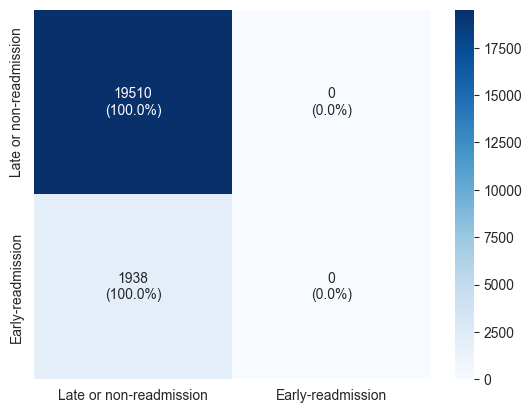

In [25]:
# Visualize confusion matrix with both absolute and percentage values
cm_none = confusion_matrix(y_test, y_test_pred_none)
cm_none_norm = confusion_matrix(y_test, y_test_pred_none, normalize='true')

annotations_none = np.array([
    [f"{val}\n({perc:.1%})" for val, perc in zip(row, norm_row)]
    for row, norm_row in zip(cm_none, cm_none_norm)
])

sns.heatmap(
    cm_none,
    annot=annotations_none,
    cmap='Blues',
    fmt='',
    xticklabels=['Late or non-readmission', 'Early-readmission'],
    yticklabels=['Late or non-readmission', 'Early-readmission']
)

## **3. Optuna Hyper-parameter Tuning | Undersampling**
Hyper-parameter tuning of the model using Optuna, and undersampling with RandomUnderSampler.

### 3.1 Objective & study setup
Preparing the objective function with all hyper-parameters, and creating/loading the Optuna study.

In [29]:
def objective(trial: optuna.Trial) -> float:
    # Hyperparameter search space
    penalty = trial.suggest_categorical("penalty", ["l1", "l2", "elasticnet"])
    params = {
        "loss": trial.suggest_categorical(
            "loss", [
                "hinge",
                "log_loss",
                "modified_huber",
                "squared_hinge",
                "perceptron"
            ]
        ),
        "penalty": penalty,
        "alpha": trial.suggest_float("alpha", 1e-6, 1e-1, log=True),
        "max_iter": trial.suggest_int("max_iter", 100, 20000),
        "tol": trial.suggest_float("tol", 1e-4, 1e-2, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "optimal", "invscaling", "adaptive"]),
        "eta0": trial.suggest_float("eta0", 1e-4, 1e-1, log=True),
        "early_stopping": True,
        "warm_start": True
    }

    # Add `l1_ratio` only if penalty is "elasticnet"
    if penalty == "elasticnet":
        params["l1_ratio"] = trial.suggest_float("l1_ratio", 0.0, 1.0)
    
    # Build pipeline
    pipeline = make_pipeline(
        RandomUnderSampler(random_state=RANDOM_STATE),
        SGDClassifier(**params, random_state=RANDOM_STATE)
    )
    
    # Define validation folds
    kf = StratifiedKFold(n_splits=5, shuffle=False)
    
    # Cross validation
    scores = cross_val_score(pipeline, X_train, y_train, cv=kf, scoring=SCORING)

    print("Cross validation scores: {}".format(scores))
    print("Average score: {}".format(scores.mean()))

    return scores.mean()

In [30]:
# Set up study with name and storage
storage = JournalStorage(JournalFileBackend(STUDY_PATH_RUS))

study = optuna.create_study(
    direction="maximize",
    study_name=STUDY_NAME,
    storage=storage,
    load_if_exists=True,
    sampler=optuna.samplers.TPESampler(constant_liar=True, seed=RANDOM_STATE),
    pruner=optuna.pruners.SuccessiveHalvingPruner()
)

optuna.logging.set_verbosity(optuna.logging.INFO)

[I 2025-01-16 21:21:24,164] A new study created in Journal with name: Diabetes_130-US


### 3.2 Hyper-parameter tuning
**(CAUTION)** <u>Do not run</u>, unless you already need to find the best parameters. If you already have bound the best model configuration, <u>run the section above</u> _(Objective & study setup)_.

In [31]:
study.optimize(
    objective,
    n_trials=N_TRIALS,
    n_jobs=-1 # Use all available cores
)

[I 2025-01-16 21:21:25,811] Trial 0 finished with value: 0.5369963559601448 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 4.522778993701827e-06, 'max_iter': 3733, 'tol': 0.0008815450695493106, 'learning_rate': 'constant', 'eta0': 0.010483099779185991}. Best is trial 0 with value: 0.5369963559601448.


Cross validation scores: [0.52625881 0.54599529 0.54787027 0.53295184 0.53190556]
Average score: 0.5369963559601448
Cross validation scores: [0.53104531 0.54517357 0.54009248 0.53819725 0.53297178]
Average score: 0.537496079273391
Cross validation scores: [0.5041331  0.53182223 0.55182152 0.53607722 0.53543802]
Average score: 0.5318584198325658


[I 2025-01-16 21:21:25,972] Trial 4 finished with value: 0.537496079273391 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.0021195818941097387, 'max_iter': 12799, 'tol': 0.00013442322334846879, 'learning_rate': 'optimal', 'eta0': 0.06132230607329642}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:25,992] Trial 1 finished with value: 0.5318584198325658 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 2.006540680077042e-05, 'max_iter': 11680, 'tol': 0.004077727709098816, 'learning_rate': 'constant', 'eta0': 0.006312128806811057}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:26,161] Trial 2 finished with value: 0.4461468874290566 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 2.155388235565929e-06, 'max_iter': 10992, 'tol': 0.008151215067210666, 'learning_rate': 'invscaling', 'eta0': 0.0003679740704548015, 'l1_ratio': 0.7777449632800378}. Best is trial 4 with value: 0.5374960

Cross validation scores: [0.44906355 0.44779601 0.45018313 0.44083287 0.44285887]
Average score: 0.4461468874290566
Cross validation scores: [0.50829119 0.49801847 0.52092696 0.51246864 0.50464903]
Average score: 0.5088708593116141
Cross validation scores: [0.51460889 0.51482823 0.51681744 0.51322211 0.50493477]
Average score: 0.5128822895091252


[I 2025-01-16 21:21:26,215] Trial 5 finished with value: 0.5128822895091252 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.027612581877153396, 'max_iter': 6373, 'tol': 0.00019840752355001478, 'learning_rate': 'invscaling', 'eta0': 0.031744185989473754}. Best is trial 4 with value: 0.537496079273391.


Cross validation scores: [0.5114252  0.51441366 0.52046641 0.51553755 0.50579908]
Average score: 0.5135283790410627
Cross validation scores: [0.50708587 0.51263356 0.52325844 0.51507879 0.50689017]
Average score: 0.512989364350848
Cross validation scores: [0.52462093 0.49649784 0.39061644 0.46445618 0.08292102]
Average score: 0.39182248266677794


[I 2025-01-16 21:21:26,677] Trial 3 finished with value: 0.5135283790410627 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.0003425212101846672, 'max_iter': 587, 'tol': 0.0014027604047523205, 'learning_rate': 'adaptive', 'eta0': 0.004215358505612141}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:26,691] Trial 6 finished with value: 0.512989364350848 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.024304257863020727, 'max_iter': 1279, 'tol': 0.00014231701128283752, 'learning_rate': 'adaptive', 'eta0': 0.0016603828279365413}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:26,783] Trial 8 finished with value: 0.39182248266677794 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 5.279867283961604e-05, 'max_iter': 6407, 'tol': 0.0006256104224575093, 'learning_rate': 'optimal', 'eta0': 0.0008683690228241138, 'l1_ratio': 0.6109321141759693}. Best is trial 4 with value: 0.53749607

Cross validation scores: [0.47992119 0.47874295 0.43359968 0.50900929 0.44684635]
Average score: 0.4696238935701843


[I 2025-01-16 21:21:27,223] Trial 9 finished with value: 0.4696238935701843 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 3.726856322221474e-05, 'max_iter': 9710, 'tol': 0.0012036559264528143, 'learning_rate': 'constant', 'eta0': 0.0012468048186765571, 'l1_ratio': 0.85776788934366}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:27,532] Trial 12 finished with value: 0.5066558875822152 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.0006625608525602555, 'max_iter': 14441, 'tol': 0.002962397137830154, 'learning_rate': 'invscaling', 'eta0': 0.012862029616651354}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:27,553] Trial 11 finished with value: 0.3254323141601628 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 0.0001274081059674803, 'max_iter': 5668, 'tol': 0.000526693380389302, 'learning_rate': 'constant', 'eta0': 0.002905370514203278}. Best is trial 4 with value: 0.53749607927339

Cross validation scores: [0.50485671 0.50743566 0.51060626 0.50996003 0.50042078]
Average score: 0.5066558875822152
Cross validation scores: [0.47577646 0.4773106  0.17362775 0.24782673 0.25262002]
Average score: 0.3254323141601628
Cross validation scores: [0.49953248 0.5231327  0.53554866 0.43217706 0.34248264]
Average score: 0.46657470858763855


[I 2025-01-16 21:21:27,715] Trial 13 finished with value: 0.46657470858763855 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 3.0529197939476225e-06, 'max_iter': 9305, 'tol': 0.00010259769870960022, 'learning_rate': 'optimal', 'eta0': 0.0025902427359097333, 'l1_ratio': 0.18882097818841292}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:27,815] Trial 10 finished with value: 0.4196526054599792 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 0.0024880000778534383, 'max_iter': 7080, 'tol': 0.0010756278736083738, 'learning_rate': 'adaptive', 'eta0': 0.0013983787159424976, 'l1_ratio': 0.07006176465352476}. Best is trial 4 with value: 0.537496079273391.


Cross validation scores: [0.52826304 0.08283698 0.48461361 0.47632501 0.52622438]
Average score: 0.4196526054599792
Cross validation scores: [0.5047448  0.51230018 0.39567888 0.3789826  0.48878907]
Average score: 0.4560991035297718
Cross validation scores: [0.52143583 0.50376701 0.53104098 0.52175627 0.49790717]
Average score: 0.5151814528719358


[I 2025-01-16 21:21:28,114] Trial 14 finished with value: 0.4560991035297718 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 3.843641958755023e-06, 'max_iter': 5217, 'tol': 0.00013576111883664138, 'learning_rate': 'optimal', 'eta0': 0.0032001536027008236, 'l1_ratio': 0.690051338571943}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:28,165] Trial 15 finished with value: 0.5151814528719358 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.001482641508174575, 'max_iter': 5416, 'tol': 0.0008528370037608655, 'learning_rate': 'optimal', 'eta0': 0.00044765898334119333, 'l1_ratio': 0.24402310310614683}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:28,359] Trial 17 finished with value: 0.5064189051924035 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00700882518771381, 'max_iter': 15927, 'tol': 0.00030754021583761387, 'learning_rate': 'constant', 'eta0': 0.07307413881100393}. Best is trial 

Cross validation scores: [0.53542967 0.41603892 0.52047827 0.5288174  0.53133027]
Average score: 0.5064189051924035


[I 2025-01-16 21:21:28,756] Trial 16 finished with value: 0.5109864752201442 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 0.058687915111607834, 'max_iter': 12591, 'tol': 0.009308102537375035, 'learning_rate': 'adaptive', 'eta0': 0.006155827166733268, 'l1_ratio': 0.7742740889704822}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:28,765] Trial 18 finished with value: 0.5046673564349468 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 1.215390146438455e-05, 'max_iter': 17656, 'tol': 0.0003881235376786212, 'learning_rate': 'optimal', 'eta0': 0.01660610494750872}. Best is trial 4 with value: 0.537496079273391.


Cross validation scores: [0.50353662 0.50949959 0.52373041 0.51172667 0.50643909]
Average score: 0.5109864752201442
Cross validation scores: [0.5015181  0.53387297 0.47950225 0.51107698 0.49736648]
Average score: 0.5046673564349468
Cross validation scores: [0.5059366  0.48863657 0.43435629 0.46717015 0.47348535]
Average score: 0.4739169923370568


[I 2025-01-16 21:21:28,882] Trial 19 finished with value: 0.4739169923370568 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.0617284703401476e-05, 'max_iter': 3341, 'tol': 0.0003289171577234496, 'learning_rate': 'optimal', 'eta0': 0.017414182782784452}. Best is trial 4 with value: 0.537496079273391.


Cross validation scores: [0.46723758 0.46862408 0.46872347 0.47132829 0.46557104]
Average score: 0.46829689184438567
Cross validation scores: [0.53189347 0.54553019 0.54494799 0.52712477 0.4872803 ]
Average score: 0.5273553438175568


[I 2025-01-16 21:21:29,164] Trial 20 finished with value: 0.46829689184438567 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.0002783634272033286, 'max_iter': 13993, 'tol': 0.002728691807077252, 'learning_rate': 'constant', 'eta0': 0.00010385491785289708}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:29,277] Trial 21 finished with value: 0.5273553438175568 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0001305131619524851, 'max_iter': 13847, 'tol': 0.0021700265009507043, 'learning_rate': 'constant', 'eta0': 0.09960196000035315}. Best is trial 4 with value: 0.537496079273391.


Cross validation scores: [0.47635241 0.53820179 0.54890494 0.53338814 0.38506172]
Average score: 0.49638180268983917
Cross validation scores: [0.47635241 0.53820179 0.54890494 0.48748336 0.48900993]
Average score: 0.5079904890817448


[I 2025-01-16 21:21:29,587] Trial 22 finished with value: 0.49638180268983917 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.01111426420096121, 'max_iter': 8392, 'tol': 0.0002700425555528936, 'learning_rate': 'constant', 'eta0': 0.030455808654716792}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:29,657] Trial 23 finished with value: 0.5079904890817448 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.007414657714173237, 'max_iter': 8246, 'tol': 0.000193682617969743, 'learning_rate': 'constant', 'eta0': 0.038534502696359586}. Best is trial 4 with value: 0.537496079273391.
[I 2025-01-16 21:21:29,678] Trial 24 finished with value: 0.5228266071819686 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.0009403605575029227, 'max_iter': 3547, 'tol': 0.005004254056555934, 'learning_rate': 'optimal', 'eta0': 0.009372280243257964}. Best is trial 4 with value: 0.537496079273391.


Cross validation scores: [0.52238474 0.50723239 0.53657068 0.53514134 0.51280389]
Average score: 0.5228266071819686
Cross validation scores: [0.513842   0.5469463  0.55329203 0.54026553 0.53598932]
Average score: 0.5380670325665748


[I 2025-01-16 21:21:30,041] Trial 25 finished with value: 0.5380670325665748 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 1.3146446429223668e-06, 'max_iter': 11562, 'tol': 0.0041191260425011535, 'learning_rate': 'constant', 'eta0': 0.0077648436123569226}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:30,309] Trial 27 finished with value: 0.5021271501757752 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 2.3904827494178448e-05, 'max_iter': 16410, 'tol': 0.004799107245701743, 'learning_rate': 'constant', 'eta0': 0.02147452806311125}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.53013601 0.51485745 0.54124184 0.49077787 0.43362258]
Average score: 0.5021271501757752
Cross validation scores: [0.52786915 0.50905414 0.53925449 0.48566179 0.4773772 ]
Average score: 0.5078433541704649


[I 2025-01-16 21:21:30,430] Trial 26 finished with value: 0.5078433541704649 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 6.971890205740777e-06, 'max_iter': 12819, 'tol': 0.001824498635272016, 'learning_rate': 'constant', 'eta0': 0.0231478753625008}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:30,645] Trial 28 finished with value: 0.5326749085707563 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 8.237785675651758e-05, 'max_iter': 11013, 'tol': 0.0008036135286788593, 'learning_rate': 'constant', 'eta0': 0.00920761914209182}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.5225067  0.54910822 0.55097439 0.5027983  0.53798693]
Average score: 0.5326749085707563
Cross validation scores: [0.50164493 0.53092539 0.55065195 0.49384416 0.53403482]
Average score: 0.5222202515987218


[I 2025-01-16 21:21:30,710] Trial 29 finished with value: 0.5222202515987218 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.1402692729806245e-06, 'max_iter': 10584, 'tol': 0.00671483520344538, 'learning_rate': 'constant', 'eta0': 0.00594916934709277}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:31,029] Trial 30 finished with value: 0.42758658718624803 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.0053857554584886e-06, 'max_iter': 12476, 'tol': 0.0032672603382288817, 'learning_rate': 'optimal', 'eta0': 0.05268402592043968}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.51749313 0.54401655 0.36061815 0.44488959 0.27091552]
Average score: 0.42758658718624803
Cross validation scores: [0.52522889 0.54701134 0.5483272  0.53357624 0.53158988]
Average score: 0.537146712087089


[I 2025-01-16 21:21:31,053] Trial 31 finished with value: 0.537146712087089 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 5.431168530102965e-06, 'max_iter': 3593, 'tol': 0.0005054740581347119, 'learning_rate': 'constant', 'eta0': 0.01030707412191148}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:31,258] Trial 32 finished with value: 0.44442470330314193 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 2.1588268847354466e-06, 'max_iter': 15556, 'tol': 0.0015554381971857963, 'learning_rate': 'invscaling', 'eta0': 0.004572962858621847}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.44771313 0.44868327 0.44410605 0.43540572 0.44621534]
Average score: 0.44442470330314193


[I 2025-01-16 21:21:31,833] Trial 34 finished with value: 0.49701171553173246 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 2.047325908168335e-05, 'max_iter': 885, 'tol': 0.004382425816139482, 'learning_rate': 'constant', 'eta0': 0.008273735874957226}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.47544872 0.46654739 0.52917127 0.49957648 0.51431471]
Average score: 0.49701171553173246


[I 2025-01-16 21:21:32,054] Trial 35 finished with value: 0.5318098510776921 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.004921075677211024, 'max_iter': 2165, 'tol': 0.0004774505536909486, 'learning_rate': 'constant', 'eta0': 0.013171236089060187}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:32,058] Trial 33 finished with value: 0.5133575784461153 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.00028320076913150463, 'max_iter': 11435, 'tol': 0.007377900190179547, 'learning_rate': 'adaptive', 'eta0': 0.06629849676923252}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.53033905 0.53968678 0.53692112 0.53719027 0.51491204]
Average score: 0.5318098510776921
Cross validation scores: [0.51014703 0.51465431 0.52139266 0.51512924 0.50546465]
Average score: 0.5133575784461153
Cross validation scores: [0.43760045 0.5303534  0.52828555 0.5379024  0.53305987]
Average score: 0.5134403308266438
Cross validation scores: [0.43766416 0.52977906 0.55471695 0.53776432 0.53258557]
Average score: 0.5185020121154817


[I 2025-01-16 21:21:32,490] Trial 36 finished with value: 0.5134403308266438 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 7.171200345174412e-06, 'max_iter': 3023, 'tol': 0.00022260469719450587, 'learning_rate': 'constant', 'eta0': 0.004478507874825544}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:32,541] Trial 37 finished with value: 0.5185020121154817 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 5.4412062908881516e-06, 'max_iter': 3878, 'tol': 0.00022988120924316387, 'learning_rate': 'constant', 'eta0': 0.004417718522646965}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:32,802] Trial 39 finished with value: 0.50329347725025 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.7966703618778203e-06, 'max_iter': 4594, 'tol': 0.0013698074468541468, 'learning_rate': 'constant', 'eta0': 0.001863188886184105}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.49317926 0.47854456 0.51897229 0.52691383 0.49885745]
Average score: 0.50329347725025
Cross validation scores: [0.50521916 0.51049425 0.50963171 0.50968796 0.49964396]
Average score: 0.5069354093019325


[I 2025-01-16 21:21:32,810] Trial 38 finished with value: 0.5069354093019325 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.9776992081619665e-06, 'max_iter': 7704, 'tol': 0.0006382791092801171, 'learning_rate': 'invscaling', 'eta0': 0.012095689366288671}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.51218675 0.50677795 0.24011285 0.36834779 0.22782109]
Average score: 0.37104928386223207


[I 2025-01-16 21:21:33,279] Trial 41 finished with value: 0.37104928386223207 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.0882592030502473e-05, 'max_iter': 2312, 'tol': 0.0007134818037207917, 'learning_rate': 'optimal', 'eta0': 0.007321488454900744}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:33,474] Trial 42 finished with value: 0.469779379629376 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 3.177644453778339e-06, 'max_iter': 9462, 'tol': 0.0004678068892878666, 'learning_rate': 'invscaling', 'eta0': 0.0007094583562733397}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.50547106 0.51800854 0.49132404 0.36600512 0.46808815]
Average score: 0.469779379629376
Cross validation scores: [0.52363886 0.50467804 0.52437962 0.33769572 0.25279004]
Average score: 0.4286364549113835
Cross validation scores: [0.51098994 0.51441366 0.52013609 0.51563121 0.50566245]
Average score: 0.5133666699457268


[I 2025-01-16 21:21:33,593] Trial 40 finished with value: 0.5133666699457268 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 4.413365827923893e-05, 'max_iter': 198, 'tol': 0.000943153968219173, 'learning_rate': 'adaptive', 'eta0': 0.024278634525910833}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:33,620] Trial 43 finished with value: 0.4286364549113835 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.003337812865692056, 'max_iter': 9749, 'tol': 0.00015208625204218902, 'learning_rate': 'constant', 'eta0': 0.03286259364146764}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.51974812 0.54703812 0.54664103 0.53914236 0.53522139]
Average score: 0.5375582037227841
Cross validation scores: [0.49178143 0.50556703 0.52477394 0.52911485 0.52710187]
Average score: 0.5156678229265703


[I 2025-01-16 21:21:33,905] Trial 44 finished with value: 0.5375582037227841 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 4.495026057435462e-06, 'max_iter': 6389, 'tol': 0.0010962190785117835, 'learning_rate': 'constant', 'eta0': 0.00913604531528435}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:33,907] Trial 45 finished with value: 0.5156678229265703 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.0004993547456006645, 'max_iter': 1673, 'tol': 0.002248824383409225, 'learning_rate': 'constant', 'eta0': 0.0025370648223674215}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.52892333 0.54532282 0.55283583 0.50224101 0.53789159]
Average score: 0.5334429170081625
Cross validation scores: [0.50235776 0.52822135 0.55212655 0.49586493 0.5366398 ]
Average score: 0.5230420808652412


[I 2025-01-16 21:21:34,283] Trial 46 finished with value: 0.5334429170081625 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.00017411065294466069, 'max_iter': 11785, 'tol': 0.0008657500871675089, 'learning_rate': 'constant', 'eta0': 0.010666523694228108, 'l1_ratio': 0.42069602096142344}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:34,314] Trial 47 finished with value: 0.5230420808652412 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.0001248075227931791, 'max_iter': 10681, 'tol': 0.000804780061701353, 'learning_rate': 'constant', 'eta0': 0.0059949676060293425, 'l1_ratio': 0.9502708313342949}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.5149297  0.49886829 0.19183873 0.2422906  0.45224306]
Average score: 0.3800340747712768


[I 2025-01-16 21:21:34,606] Trial 48 finished with value: 0.3800340747712768 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 5.765598738007259e-05, 'max_iter': 14920, 'tol': 0.0012834674778736113, 'learning_rate': 'optimal', 'eta0': 0.01777305744514239}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:35,206] Trial 50 finished with value: 0.5288994676282951 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.6371957756514145e-06, 'max_iter': 7073, 'tol': 0.0005551322172607707, 'learning_rate': 'constant', 'eta0': 0.014638029340669392}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.53235629 0.52702122 0.54956767 0.50929909 0.52625306]
Average score: 0.5288994676282951
Cross validation scores: [0.53175516 0.52770368 0.54877854 0.50422136 0.52333531]
Average score: 0.5271588107099916


[I 2025-01-16 21:21:35,231] Trial 51 finished with value: 0.5271588107099916 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.3853258612304948e-06, 'max_iter': 4487, 'tol': 0.0010450808506505425, 'learning_rate': 'constant', 'eta0': 0.01568849420767858}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:35,853] Trial 52 finished with value: 0.4833094978057482 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 2.8300115897066673e-05, 'max_iter': 5919, 'tol': 0.0017265705329428545, 'learning_rate': 'optimal', 'eta0': 0.00018474439657070212}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:35,937] Trial 53 finished with value: 0.44467346174128297 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 2.8394899582805897e-06, 'max_iter': 5855, 'tol': 0.0017385802255269066, 'learning_rate': 'optimal', 'eta0': 0.00017322571052936852}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.4767668  0.48236735 0.54272456 0.48480927 0.4298795 ]
Average score: 0.4833094978057482
Cross validation scores: [0.50632152 0.51679174 0.46374649 0.47199055 0.26451701]
Average score: 0.44467346174128297
Cross validation scores: [0.51136024 0.51467558 0.52133984 0.51556603 0.50531611]
Average score: 0.5136515584593497
Cross validation scores: [0.43595563 0.43445807 0.44045139 0.42875091 0.43173967]
Average score: 0.43427113473890644


[I 2025-01-16 21:21:36,118] Trial 49 finished with value: 0.5136515584593497 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 4.5794956657271555e-06, 'max_iter': 6443, 'tol': 0.00040552325142342903, 'learning_rate': 'adaptive', 'eta0': 0.003431637631874747}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:36,136] Trial 55 finished with value: 0.43427113473890644 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 1.1212370787970269e-05, 'max_iter': 13400, 'tol': 0.003442860024910998, 'learning_rate': 'invscaling', 'eta0': 0.002047878313257103}. Best is trial 25 with value: 0.5380670325665748.
[I 2025-01-16 21:21:36,192] Trial 54 finished with value: 0.5277303606009094 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0014837986058343967, 'max_iter': 8778, 'tol': 0.0035317947256572123, 'learning_rate': 'invscaling', 'eta0': 0.09461149700595164}. Best is trial 25 with value: 0.5380670325665748.


Cross validation scores: [0.52473052 0.53533623 0.53554996 0.52015335 0.52288175]
Average score: 0.5277303606009094
Cross validation scores: [0.53349511 0.54892795 0.55192689 0.53455391 0.53363661]
Average score: 0.540508094228736


[I 2025-01-16 21:21:36,451] Trial 56 finished with value: 0.540508094228736 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 1.4678446912328361e-05, 'max_iter': 19776, 'tol': 0.00012066573481787315, 'learning_rate': 'constant', 'eta0': 0.009697564657183112}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.53796185 0.52601965 0.51073751 0.53770923 0.25362495]
Average score: 0.4732106361122138
Cross validation scores: [0.53586036 0.54183548 0.53435293 0.53770923 0.52888172]
Average score: 0.5357279436780602


[I 2025-01-16 21:21:36,677] Trial 57 finished with value: 0.5357279436780602 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.015048695205817952, 'max_iter': 12717, 'tol': 0.0006780562549164147, 'learning_rate': 'constant', 'eta0': 0.01070818971500725, 'l1_ratio': 0.42146242339133194}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:36,682] Trial 58 finished with value: 0.4732106361122138 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.018053183889994183, 'max_iter': 11816, 'tol': 0.001134066868374465, 'learning_rate': 'constant', 'eta0': 0.011546973747429306, 'l1_ratio': 0.41536542379286573}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.50397627 0.5319493  0.55170047 0.53748313 0.53443249]
Average score: 0.5319083326249183


[I 2025-01-16 21:21:37,124] Trial 59 finished with value: 0.5319083326249183 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 7.031370887448467e-06, 'max_iter': 12150, 'tol': 0.00036018595750541427, 'learning_rate': 'constant', 'eta0': 0.006333991541925073, 'l1_ratio': 0.05077366682789275}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.51672233 0.49295827 0.46039769 0.4183366  0.49374312]
Average score: 0.4764316001240963


[I 2025-01-16 21:21:37,647] Trial 60 finished with value: 0.4764316001240963 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 1.6518009725989853e-05, 'max_iter': 19852, 'tol': 0.00012465123744314548, 'learning_rate': 'constant', 'eta0': 0.04777087069336813, 'l1_ratio': 0.5414973683315221}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:37,739] Trial 61 finished with value: 0.46733938213017057 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 4.16350164563072e-06, 'max_iter': 17073, 'tol': 0.0001646157624621358, 'learning_rate': 'constant', 'eta0': 0.02513897874488761}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.50186964 0.48740094 0.53774918 0.42131753 0.38835962]
Average score: 0.46733938213017057


[I 2025-01-16 21:21:38,082] Trial 62 finished with value: 0.45167102462099995 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.03605559127351178, 'max_iter': 18756, 'tol': 0.00010893451966710988, 'learning_rate': 'constant', 'eta0': 0.007957659646968535}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.52388346 0.11517096 0.54890494 0.53498427 0.53541148]
Average score: 0.45167102462099995
Cross validation scores: [0.47279918 0.52235086 0.51019435 0.53246973 0.52682952]
Average score: 0.5129287300640853


[I 2025-01-16 21:21:38,137] Trial 63 finished with value: 0.5129287300640853 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 2.396805652219591e-06, 'max_iter': 19184, 'tol': 0.00011154717812098292, 'learning_rate': 'constant', 'eta0': 0.003564165940466515}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:38,493] Trial 65 finished with value: 0.47900240494757984 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 4.670727771270991e-06, 'max_iter': 7122, 'tol': 0.0058015445796404325, 'learning_rate': 'optimal', 'eta0': 0.0012404879389992355}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.47599553 0.49496435 0.5005369  0.43223489 0.49128036]
Average score: 0.47900240494757984
Cross validation scores: [0.45397923 0.50267517 0.39513549 0.39224065 0.41297094]
Average score: 0.4314002979425974
Cross validation scores: [0.50014476 0.52793678 0.55189563 0.49333179 0.53469373]
Average score: 0.5216005404323559


[I 2025-01-16 21:21:38,618] Trial 66 finished with value: 0.4314002979425974 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 1.4780439558169418e-05, 'max_iter': 2729, 'tol': 0.00017184013206016728, 'learning_rate': 'constant', 'eta0': 0.010209198372915026}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:38,728] Trial 67 finished with value: 0.5216005404323559 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 3.234337794015452e-05, 'max_iter': 14496, 'tol': 0.0006882511239259491, 'learning_rate': 'constant', 'eta0': 0.005439107444004811}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:39,021] Trial 68 finished with value: 0.5363204600646352 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.06020762726255874, 'max_iter': 13023, 'tol': 0.00012823707794072347, 'learning_rate': 'constant', 'eta0': 0.007059148945768677, 'l1_ratio': 0.3320063590295137}. Best is trial 56 with value: 0.5405

Cross validation scores: [0.52224154 0.54149475 0.54759571 0.5349438  0.5353265 ]
Average score: 0.5363204600646352
Cross validation scores: [0.47635241 0.47635241 0.54890494 0.5359983  0.51400375]
Average score: 0.5103223626524


[I 2025-01-16 21:21:39,172] Trial 69 finished with value: 0.5103223626524 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.09581691166780372, 'max_iter': 10355, 'tol': 0.0005605072640839458, 'learning_rate': 'constant', 'eta0': 0.030015703550396622, 'l1_ratio': 0.5138454058250951}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.51006277 0.51452331 0.52167104 0.5150169  0.50598193]
Average score: 0.5134511924814686
Cross validation scores: [0.53721662 0.49822294 0.54890494 0.52206998 0.53827013]
Average score: 0.5289369227303842


[I 2025-01-16 21:21:39,441] Trial 64 finished with value: 0.5134511924814686 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 7.516575398666091e-06, 'max_iter': 4711, 'tol': 0.00028337744381456016, 'learning_rate': 'adaptive', 'eta0': 0.019601892869508607}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:39,672] Trial 70 finished with value: 0.5289369227303842 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.01312271576759383, 'max_iter': 18319, 'tol': 0.009738098984419324, 'learning_rate': 'constant', 'eta0': 0.014404428994940875}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.51894255 0.47495283 0.52178718 0.53777206 0.53691054]
Average score: 0.5180730318096709
Cross validation scores: [0.50954605 0.53217675 0.55365689 0.54148665 0.53656088]
Average score: 0.5346854433923228


[I 2025-01-16 21:21:39,739] Trial 71 finished with value: 0.5180730318096709 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.01079903784737201, 'max_iter': 17532, 'tol': 0.00023828292859837138, 'learning_rate': 'constant', 'eta0': 0.005072830149211018}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:39,806] Trial 72 finished with value: 0.5346854433923228 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.001134439430424362, 'max_iter': 3793, 'tol': 0.000129518992650688, 'learning_rate': 'constant', 'eta0': 0.007262376451576371}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.43451453 0.43401161 0.4489154  0.44856081 0.44797756]
Average score: 0.442795981474125
Cross validation scores: [0.51929082 0.54743971 0.5508542  0.4733779  0.53405752]
Average score: 0.5250040304325696


[I 2025-01-16 21:21:40,190] Trial 73 finished with value: 0.442795981474125 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 0.03658943121433057, 'max_iter': 13877, 'tol': 0.00014712813539932923, 'learning_rate': 'optimal', 'eta0': 0.0037153330494102397, 'l1_ratio': 0.3069720589074634}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:40,222] Trial 74 finished with value: 0.5250040304325696 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 3.3298776315320057e-06, 'max_iter': 15531, 'tol': 0.00010017628561049467, 'learning_rate': 'constant', 'eta0': 0.0090714825677419}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.50644386 0.54327127 0.55379139 0.5397049  0.53559716]
Average score: 0.5357617151954551
Cross validation scores: [0.50711428 0.54347167 0.55446143 0.53938782 0.5358807 ]
Average score: 0.5360631808901639


[I 2025-01-16 21:21:40,666] Trial 75 finished with value: 0.5357617151954551 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.1611009126342842e-06, 'max_iter': 12552, 'tol': 0.000185564232451286, 'learning_rate': 'constant', 'eta0': 0.006807980956019807}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:40,772] Trial 76 finished with value: 0.5360631808901639 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.0018318101452455e-06, 'max_iter': 13322, 'tol': 0.00018915639355074595, 'learning_rate': 'constant', 'eta0': 0.006875312497017907}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.53781126 0.54183548 0.51073751 0.53770923 0.52888172]
Average score: 0.5313950391898998


[I 2025-01-16 21:21:41,164] Trial 77 finished with value: 0.5313950391898998 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.026321253783463845, 'max_iter': 11032, 'tol': 0.0025604003681488647, 'learning_rate': 'constant', 'eta0': 0.010646426938749171, 'l1_ratio': 0.14665090114678248}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:41,410] Trial 78 finished with value: 0.5375817979447618 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.09568933778498868, 'max_iter': 13067, 'tol': 0.0009612944545740956, 'learning_rate': 'constant', 'eta0': 0.008144039228160574, 'l1_ratio': 0.3363963780493557}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.52219079 0.54211529 0.54890494 0.54039939 0.53429858]
Average score: 0.5375817979447618


[I 2025-01-16 21:21:41,671] Trial 80 finished with value: 0.5136701696916411 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.05017856365022874, 'max_iter': 8989, 'tol': 0.00012118120991239078, 'learning_rate': 'constant', 'eta0': 0.002580247397826999, 'l1_ratio': 0.6200498369751006}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.49572545 0.52658346 0.52574643 0.52748298 0.49281253]
Average score: 0.5136701696916411
Cross validation scores: [0.49358094 0.5269855  0.54553079 0.54275346 0.50297692]
Average score: 0.5223655229632582


[I 2025-01-16 21:21:41,769] Trial 79 finished with value: 0.5223655229632582 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.0035289930878054264, 'max_iter': 11307, 'tol': 0.0002205589872983096, 'learning_rate': 'constant', 'eta0': 0.0051701603169856634, 'l1_ratio': 0.3163713461212317}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.53039104 0.54023995 0.54710476 0.46433293 0.52746348]
Average score: 0.5219064319703972


[I 2025-01-16 21:21:42,063] Trial 81 finished with value: 0.5219064319703972 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 1.391702694435566e-06, 'max_iter': 13210, 'tol': 0.00025587866290204887, 'learning_rate': 'constant', 'eta0': 0.013216986913044093}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:42,413] Trial 83 finished with value: 0.42622850813653484 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 2.0925547984701137e-06, 'max_iter': 16192, 'tol': 0.0015091202659713418, 'learning_rate': 'optimal', 'eta0': 0.008764814639023831}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:42,421] Trial 84 finished with value: 0.4840135040875226 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 2.655103767341077e-06, 'max_iter': 4974, 'tol': 0.0009544496977266494, 'learning_rate': 'optimal', 'eta0': 0.008176698653942549}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.47417251 0.5101297  0.54444086 0.39859282 0.20380665]
Average score: 0.42622850813653484
Cross validation scores: [0.47180769 0.5038409  0.47983728 0.45930227 0.50527938]
Average score: 0.4840135040875226


[I 2025-01-16 21:21:42,804] Trial 85 finished with value: 0.46676745853172674 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.06987159628232466, 'max_iter': 1476, 'tol': 0.00020276052855105876, 'learning_rate': 'constant', 'eta0': 0.016926260742815714, 'l1_ratio': 0.3412243206962768}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.51191434 0.51334947 0.54890494 0.54045606 0.21921248]
Average score: 0.46676745853172674


[I 2025-01-16 21:21:43,090] Trial 82 finished with value: 0.5122051304521783 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 5.532806246517992e-06, 'max_iter': 14933, 'tol': 0.0001444138818823171, 'learning_rate': 'adaptive', 'eta0': 0.004038399981056184, 'l1_ratio': 0.01955750442604609}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:43,099] Trial 86 finished with value: 0.5203020459843211 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.000613664753805526, 'max_iter': 13239, 'tol': 0.00016253996311138108, 'learning_rate': 'constant', 'eta0': 0.006336981986938203}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.50943489 0.51284506 0.52000404 0.51436238 0.50437929]
Average score: 0.5122051304521783
Cross validation scores: [0.50403879 0.53221955 0.55266223 0.53797392 0.47461574]
Average score: 0.5203020459843211
Cross validation scores: [0.47635241 0.54864456 0.54890494 0.54045606 0.51400375]
Average score: 0.5256723443732965


[I 2025-01-16 21:21:43,311] Trial 87 finished with value: 0.5256723443732965 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.06939589842756944, 'max_iter': 10094, 'tol': 0.0003098206981952796, 'learning_rate': 'constant', 'eta0': 0.0195764915730798}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:43,317] Trial 88 finished with value: 0.5338192288056616 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 8.547008169833069e-06, 'max_iter': 14391, 'tol': 0.0004527975536440642, 'learning_rate': 'constant', 'eta0': 0.012554703429098313}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.53073022 0.54495248 0.54520128 0.51775594 0.53045623]
Average score: 0.5338192288056616
Cross validation scores: [0.47961031 0.51047947 0.51181978 0.53121336 0.52282503]
Average score: 0.5111895910384792


[I 2025-01-16 21:21:43,523] Trial 89 finished with value: 0.5111895910384792 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.0338534663401773e-06, 'max_iter': 12096, 'tol': 0.0001824969981791867, 'learning_rate': 'constant', 'eta0': 0.0029992861305341238}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:43,718] Trial 91 finished with value: 0.4159335037040425 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.8460084480930903e-06, 'max_iter': 2090, 'tol': 0.0011966648533799989, 'learning_rate': 'constant', 'eta0': 0.06474065632496609}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.43771659 0.52502094 0.53011567 0.49732399 0.53427092]
Average score: 0.504889621612105
Cross validation scores: [0.51411878 0.4998459  0.43443113 0.39060182 0.24066989]
Average score: 0.4159335037040425


[I 2025-01-16 21:21:43,851] Trial 90 finished with value: 0.504889621612105 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 1.7229035134321155e-06, 'max_iter': 13641, 'tol': 0.00013088161494814352, 'learning_rate': 'constant', 'eta0': 0.004716757529603886}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.49204145 0.49170228 0.5071833  0.49877977 0.49543748]
Average score: 0.4970288550763353


[I 2025-01-16 21:21:44,271] Trial 92 finished with value: 0.4970288550763353 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 0.0900967752102072, 'max_iter': 3297, 'tol': 0.002173197344629719, 'learning_rate': 'invscaling', 'eta0': 0.007365850341178698, 'l1_ratio': 0.14281671706794663}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:44,594] Trial 94 finished with value: 0.5355750886071898 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 3.3066911404281486e-06, 'max_iter': 4019, 'tol': 0.0007649713632689949, 'learning_rate': 'constant', 'eta0': 0.006815558943622571}. Best is trial 56 with value: 0.540508094228736.


Cross validation scores: [0.50669443 0.5434853  0.55334718 0.53931677 0.53503176]
Average score: 0.5355750886071898
Cross validation scores: [0.46193803 0.54668686 0.56042649 0.53521962 0.53778531]
Average score: 0.52841125979365


[I 2025-01-16 21:21:44,666] Trial 93 finished with value: 0.52841125979365 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.006927126757728384, 'max_iter': 8130, 'tol': 0.00019928527694982364, 'learning_rate': 'constant', 'eta0': 0.0069237937925215425}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:44,990] Trial 95 finished with value: 0.5108015449552251 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 1.4101509610307517e-06, 'max_iter': 12703, 'tol': 0.00011334932146949515, 'learning_rate': 'constant', 'eta0': 0.005603556125620546}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:44,997] Trial 96 finished with value: 0.5369763715452975 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 5.467683564464941e-06, 'max_iter': 12333, 'tol': 0.00014045102417008422, 'learning_rate': 'constant', 'eta0': 0.010152939048531824}. Best is trial 56 with value: 0.540508094228736.
[I 2025-01-16 21:21:45,065]

Cross validation scores: [0.51712336 0.51380344 0.50648935 0.50583413 0.51075744]
Average score: 0.5108015449552251
Cross validation scores: [0.52566699 0.54759341 0.54773894 0.5324516  0.53143092]
Average score: 0.5369763715452975
Cross validation scores: [0.5187694  0.54660031 0.55041637 0.53890358 0.53486244]
Average score: 0.5379104208186875
Cross validation scores: [0.53022076 0.54163732 0.54690781 0.46652424 0.52942381]
Average score: 0.522942786513896
Cross validation scores: [0.43885284 0.52242053 0.52595124 0.53686859 0.53190949]
Average score: 0.511200534369599


In [32]:
print('Best Trial: {}'.format(study.best_trial.number))
print('Best Parameters: {}'.format(study.best_params))
print('Best Value: {}'.format(study.best_value))

Best Trial: 56
Best Parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 1.4678446912328361e-05, 'max_iter': 19776, 'tol': 0.00012066573481787315, 'learning_rate': 'constant', 'eta0': 0.009697564657183112}
Best Value: 0.540508094228736


### 3.3 Optuna Visualizations
Visualizing hyper-parameter tuning results obtained by running Optuna.

In [33]:
optuna.visualization.plot_optimization_history(study)

In [34]:
optuna.visualization.plot_slice(study)

In [35]:
optuna.visualization.plot_param_importances(study)

In [36]:
optuna.visualization.plot_parallel_coordinate(study)

In [37]:
optuna.visualization.plot_contour(study)

In [38]:
optuna.visualization.plot_timeline(study)

### 3.4 Fitting Best Model
Fitting the final model using the best hyper-parameters found by Optuna.

In [39]:
# Fit best model on the training set
best_params = study.best_params

pipeline_rus = make_pipeline(
    RandomUnderSampler(random_state=RANDOM_STATE),
    SGDClassifier(**best_params, random_state=RANDOM_STATE)
)

pipeline_rus.fit(X_train, y_train)

Pipeline(steps=[('randomundersampler', RandomUnderSampler(random_state=38)),
                ('sgdclassifier',
                 SGDClassifier(alpha=1.4678446912328361e-05,
                               eta0=0.009697564657183112,
                               learning_rate='constant', loss='squared_hinge',
                               max_iter=19776, penalty='l1', random_state=38,
                               tol=0.00012066573481787315))])

In [40]:
# Predictions
y_train_pred_rus = pipeline_rus.predict(X_train)
y_test_pred_rus = pipeline_rus.predict(X_test)

In [41]:
ac_train_rus = accuracy_score(y_train, y_train_pred_rus)
ac_test_rus = accuracy_score(y_test, y_test_pred_rus)

print('Train accuracy: ', ac_train_rus)
print('Test accuracy: ', ac_test_rus)

Train accuracy:  0.6615845738835049
Test accuracy:  0.6542334949645655


In [42]:
# Visualize precision, recall, F1-score
print(classification_report(
    y_test, y_test_pred_rus,
    target_names=['Late or non-readmission', 'Early-readmission']
))

                         precision    recall  f1-score   support

Late or non-readmission       0.93      0.67      0.78     19510
      Early-readmission       0.13      0.51      0.21      1938

               accuracy                           0.65     21448
              macro avg       0.53      0.59      0.49     21448
           weighted avg       0.86      0.65      0.73     21448



In [43]:
# Compute precision, recall, F1-score, ROC-AUC-score, and accuracy
recall_rus = recall_score(y_test, y_test_pred_rus, average='macro')
precision_rus = precision_score(y_test, y_test_pred_rus, average='macro')
f1_rus = f1_score(y_test, y_test_pred_rus, average='macro')
roc_auc_rus = roc_auc_score(y_test, y_test_pred_rus, average='macro')
accuracy_rus = accuracy_score(y_test, y_test_pred_rus)

<Axes: >

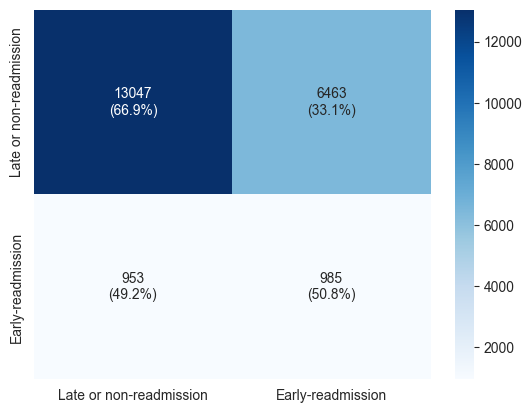

In [44]:
# Visualize confusion matrix with both absolute and percentage values
cm_rus = confusion_matrix(y_test, y_test_pred_rus)
cm_rus_norm = confusion_matrix(y_test, y_test_pred_rus, normalize='true')

annotations_rus = np.array([
    [f"{val}\n({perc:.1%})" for val, perc in zip(row, norm_row)]
    for row, norm_row in zip(cm_rus, cm_rus_norm)
])

sns.heatmap(
    cm_rus,
    annot=annotations_rus,
    cmap='Blues',
    fmt='',
    xticklabels=['Late or non-readmission', 'Early-readmission'],
    yticklabels=['Late or non-readmission', 'Early-readmission']
)

## **4. Optuna Hyper-parameter Tuning | SMOTE**
Hyper-parameter tuning of the model using Optuna, and oversampling with SMOTE.

### 4.1 Objective & study setup
Preparing the objective function with all hyper-parameters, and creating/loading the Optuna study.

In [45]:
def objective(trial: optuna.Trial) -> float:
    # Hyperparameter search space
    penalty = trial.suggest_categorical("penalty", ["l1", "l2", "elasticnet"])
    params = {
        "loss": trial.suggest_categorical(
            "loss", [
                "hinge",
                "log_loss",
                "modified_huber",
                "squared_hinge",
                "perceptron"
            ]
        ),
        "penalty": penalty,
        "alpha": trial.suggest_float("alpha", 1e-6, 1e-1, log=True),
        "max_iter": trial.suggest_int("max_iter", 100, 20000),
        "tol": trial.suggest_float("tol", 1e-4, 1e-2, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "optimal", "invscaling", "adaptive"]),
        "eta0": trial.suggest_float("eta0", 1e-4, 1e-1, log=True),
        "early_stopping": True,
        "warm_start": True
    }

    # Add `l1_ratio` only if penalty is "elasticnet"
    if penalty == "elasticnet":
        params["l1_ratio"] = trial.suggest_float("l1_ratio", 0.0, 1.0)
    
    # Build pipeline
    pipeline = make_pipeline(
        SMOTE(random_state=RANDOM_STATE),
        SGDClassifier(**params, random_state=RANDOM_STATE)
    )
    
    # Define validation folds
    kf = StratifiedKFold(n_splits=5, shuffle=False)
    
    # Cross validation
    scores = cross_val_score(pipeline, X_train, y_train, cv=kf, scoring=SCORING)

    print("Cross validation scores: {}".format(scores))
    print("Average score: {}".format(scores.mean()))

    return scores.mean()

In [46]:
# Set up study with name and storage
storage = JournalStorage(JournalFileBackend(STUDY_PATH_SMOTE))

study = optuna.create_study(
    direction="maximize",
    study_name=STUDY_NAME,
    storage=storage,
    load_if_exists=True,
    sampler=optuna.samplers.TPESampler(constant_liar=True, seed=RANDOM_STATE),
    pruner=optuna.pruners.SuccessiveHalvingPruner()
)

optuna.logging.set_verbosity(optuna.logging.INFO)

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\optuna\_experimental.py:31: ExperimentalWarning:

Argument ``constant_liar`` is an experimental feature. The interface can change in the future.

[I 2025-01-16 21:21:47,977] A new study created in Journal with name: Diabetes_130-US


### 4.2 Hyper-parameter tuning
**(CAUTION)** <u>Do not run</u>, unless you already need to find the best parameters. If you already have bound the best model configuration, <u>run the section above</u> _(Objective & study setup)_.

In [47]:
study.optimize(
    objective,
    n_trials=N_TRIALS,
    n_jobs=-1 # Use all available cores
)

[I 2025-01-16 21:21:51,755] Trial 4 finished with value: 0.5010364849560569 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.005739680335444212, 'max_iter': 6442, 'tol': 0.00018274600003645637, 'learning_rate': 'constant', 'eta0': 0.000976585616613933}. Best is trial 4 with value: 0.5010364849560569.


Cross validation scores: [0.48000126 0.49730333 0.50762009 0.52406137 0.49619638]
Average score: 0.5010364849560569


[I 2025-01-16 21:21:52,358] Trial 1 finished with value: 0.5323624477569293 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0018899154890075912, 'max_iter': 15402, 'tol': 0.001076962180369052, 'learning_rate': 'constant', 'eta0': 0.004941760383787338}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:52,421] Trial 2 finished with value: 0.4408611741887409 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 4.313140495666848e-05, 'max_iter': 5477, 'tol': 0.0004913674123334098, 'learning_rate': 'invscaling', 'eta0': 0.001304247721510876}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.52091905 0.53856206 0.53883047 0.53554996 0.5279507 ]
Average score: 0.5323624477569293
Cross validation scores: [0.44251433 0.44261876 0.43893742 0.44501627 0.43521909]
Average score: 0.4408611741887409
Cross validation scores: [0.46738374 0.46708527 0.47252006 0.46629033 0.46066933]
Average score: 0.4667897457254203


[I 2025-01-16 21:21:52,664] Trial 3 finished with value: 0.4667897457254203 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 7.2212280418507785e-06, 'max_iter': 15169, 'tol': 0.0009422520732576244, 'learning_rate': 'invscaling', 'eta0': 0.0035038701364495895}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:52,755] Trial 7 finished with value: 0.4933119677568107 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 2.575828795505355e-06, 'max_iter': 1254, 'tol': 0.0003436133459014056, 'learning_rate': 'constant', 'eta0': 0.00032989993903007894, 'l1_ratio': 0.6029639426757744}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.49646071 0.46603203 0.51025078 0.4861529  0.50766341]
Average score: 0.4933119677568107
Cross validation scores: [0.52258848 0.38754932 0.45445038 0.41593985 0.43344215]
Average score: 0.4427940363042529


[I 2025-01-16 21:21:52,857] Trial 5 finished with value: 0.4427940363042529 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 9.658256378858966e-05, 'max_iter': 10442, 'tol': 0.00044402335472665055, 'learning_rate': 'constant', 'eta0': 0.00999669049928275}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:55,755] Trial 0 finished with value: 0.5233408797919635 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 4.362291315295484e-05, 'max_iter': 3108, 'tol': 0.000975069459868768, 'learning_rate': 'adaptive', 'eta0': 0.0010004356171348149}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.51650453 0.52414195 0.52966223 0.53303988 0.51335581]
Average score: 0.5233408797919635
Cross validation scores: [0.49197839 0.45719281 0.37363334 0.37865176 0.34073366]
Average score: 0.40843799188005836


[I 2025-01-16 21:21:56,005] Trial 9 finished with value: 0.40843799188005836 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.00016511560183449315, 'max_iter': 12226, 'tol': 0.001612155083537951, 'learning_rate': 'optimal', 'eta0': 0.00012707994630513014}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:56,016] Trial 10 finished with value: 0.41159192861459604 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 1.24540807622524e-05, 'max_iter': 16595, 'tol': 0.0007046413338672036, 'learning_rate': 'optimal', 'eta0': 0.09910418011211172}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.47969482 0.48534186 0.36216419 0.42568814 0.30507064]
Average score: 0.41159192861459604
Cross validation scores: [0.52307169 0.53594378 0.52902664 0.5277086  0.52621774]
Average score: 0.5283936903497034
Cross validation scores: [0.47302284 0.42325346 0.33070754 0.30045467 0.40935055]
Average score: 0.38735780908037093


[I 2025-01-16 21:21:56,357] Trial 11 finished with value: 0.5283936903497034 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.02432513716639309, 'max_iter': 4056, 'tol': 0.0018297708568061402, 'learning_rate': 'constant', 'eta0': 0.00033875860463078184, 'l1_ratio': 0.8625798065408118}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:56,442] Trial 12 finished with value: 0.38735780908037093 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 1.9568853808941303e-06, 'max_iter': 19147, 'tol': 0.004042900501708542, 'learning_rate': 'optimal', 'eta0': 0.06257911908656276, 'l1_ratio': 0.041100284738569526}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:56,490] Trial 13 finished with value: 0.4853559888010187 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 1.0605868903369607e-06, 'max_iter': 10499, 'tol': 0.00046189294959778104, 'learning_rate': 'constant', 'eta0': 0.006708607484734336, 

Cross validation scores: [0.50116745 0.49645994 0.46917888 0.51712282 0.44285085]
Average score: 0.4853559888010187


[I 2025-01-16 21:21:56,936] Trial 6 finished with value: 0.5031291775073163 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.002418975213369605, 'max_iter': 228, 'tol': 0.0010277295309483318, 'learning_rate': 'adaptive', 'eta0': 0.035030421201013275}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.50383361 0.50327301 0.5083113  0.50349508 0.49673289]
Average score: 0.5031291775073163


[I 2025-01-16 21:21:59,476] Trial 14 finished with value: 0.5034236037929748 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 7.705889525246864e-06, 'max_iter': 17032, 'tol': 0.00020158190243779145, 'learning_rate': 'invscaling', 'eta0': 0.01308374174773658}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.50862117 0.50074629 0.51226662 0.50514964 0.49033429]
Average score: 0.5034236037929748
Cross validation scores: [0.21051669 0.29588472 0.46047232 0.36479568 0.50036043]
Average score: 0.36640596648235335


[I 2025-01-16 21:21:59,671] Trial 8 finished with value: 0.36640596648235335 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.0006180124970434348, 'max_iter': 859, 'tol': 0.0002708173850186433, 'learning_rate': 'adaptive', 'eta0': 0.022055756131662035}. Best is trial 1 with value: 0.5323624477569293.
[I 2025-01-16 21:21:59,770] Trial 15 finished with value: 0.5024903511058408 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 3.086316169766825e-06, 'max_iter': 16421, 'tol': 0.00015992584311885704, 'learning_rate': 'invscaling', 'eta0': 0.04763860606000308}. Best is trial 1 with value: 0.5323624477569293.


Cross validation scores: [0.48916097 0.51227117 0.51114965 0.50370802 0.49616195]
Average score: 0.5024903511058408


[I 2025-01-16 21:22:00,256] Trial 17 finished with value: 0.532729157018583 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.09115440223822995, 'max_iter': 13603, 'tol': 0.0030514119702849153, 'learning_rate': 'constant', 'eta0': 0.0002457975766193608, 'l1_ratio': 0.9817283565082537}. Best is trial 17 with value: 0.532729157018583.


Cross validation scores: [0.52826304 0.54864456 0.54378673 0.52799793 0.51495353]
Average score: 0.532729157018583
Cross validation scores: [0.51900095 0.5312568  0.54279839 0.53581643 0.5331237 ]
Average score: 0.532399253825648
Cross validation scores: [0.52395293 0.52482204 0.53699379 0.5273587  0.52260183]
Average score: 0.5271458579187722


[I 2025-01-16 21:22:00,345] Trial 19 finished with value: 0.532399253825648 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.009335607445976085, 'max_iter': 8329, 'tol': 0.009785053162085958, 'learning_rate': 'constant', 'eta0': 0.0027593421748245374}. Best is trial 17 with value: 0.532729157018583.
[I 2025-01-16 21:22:00,350] Trial 18 finished with value: 0.5271458579187722 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.04507914427583214, 'max_iter': 6801, 'tol': 0.0017677721041058757, 'learning_rate': 'constant', 'eta0': 0.00042649199744876923, 'l1_ratio': 0.6925761525074445}. Best is trial 17 with value: 0.532729157018583.
[I 2025-01-16 21:22:00,987] Trial 20 finished with value: 0.5230629987407411 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0010079561098990085, 'max_iter': 13086, 'tol': 0.0032678884241537807, 'learning_rate': 'constant', 'eta0': 0.00010067846665514531, 'l1_ratio': 0.7764112705929974}. Best is trial 17 wi

Cross validation scores: [0.52341368 0.5207827  0.5321677  0.52202798 0.51692294]
Average score: 0.5230629987407411


[I 2025-01-16 21:22:03,363] Trial 22 finished with value: 0.5355860152703873 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.002227006392177861, 'max_iter': 9024, 'tol': 0.0017150324338354739, 'learning_rate': 'constant', 'eta0': 0.0005357713961628888, 'l1_ratio': 0.3606018617459572}. Best is trial 22 with value: 0.5355860152703873.


Cross validation scores: [0.53662613 0.52963569 0.54272812 0.53581643 0.5331237 ]
Average score: 0.5355860152703873


[I 2025-01-16 21:22:03,771] Trial 23 finished with value: 0.5325723675075265 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.016034616522743725, 'max_iter': 3902, 'tol': 0.008851879652165986, 'learning_rate': 'optimal', 'eta0': 0.0051474856638529035}. Best is trial 22 with value: 0.5355860152703873.
[I 2025-01-16 21:22:03,775] Trial 21 finished with value: 0.46890669715029815 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.020359680100188245, 'max_iter': 3757, 'tol': 0.00010037187111644836, 'learning_rate': 'constant', 'eta0': 0.006061806447591759}. Best is trial 22 with value: 0.5355860152703873.
[I 2025-01-16 21:22:03,850] Trial 16 finished with value: 0.5047556978646256 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.00021750267959255953, 'max_iter': 18359, 'tol': 0.0008541642880471184, 'learning_rate': 'adaptive', 'eta0': 0.0021302351730840734, 'l1_ratio': 0.9899491391992061}. Best is trial 22 with value: 0.53558601527038

Cross validation scores: [0.51966314 0.53131189 0.54384715 0.53491596 0.5331237 ]
Average score: 0.5325723675075265
Cross validation scores: [0.52125967 0.50952982 0.50910956 0.41431927 0.39031516]
Average score: 0.46890669715029815
Cross validation scores: [0.50583218 0.50475537 0.50961285 0.50554314 0.49803494]
Average score: 0.5047556978646256


[I 2025-01-16 21:22:04,474] Trial 26 finished with value: 0.48741204084644085 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.07576471479771682, 'max_iter': 13784, 'tol': 0.006862592453918806, 'learning_rate': 'constant', 'eta0': 0.00018166815011374788}. Best is trial 22 with value: 0.5355860152703873.


Cross validation scores: [0.47058809 0.45791418 0.51545479 0.50716434 0.4859388 ]
Average score: 0.48741204084644085
Cross validation scores: [0.48493529 0.47552281 0.51530069 0.51376412 0.50024926]
Average score: 0.4979544337284209
Cross validation scores: [0.51900095 0.52976922 0.54322036 0.53581643 0.5331237 ]
Average score: 0.5321861330602415


[I 2025-01-16 21:22:04,509] Trial 25 finished with value: 0.4979544337284209 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 0.007853987109474983, 'max_iter': 12308, 'tol': 0.005195549630299625, 'learning_rate': 'constant', 'eta0': 0.0018456454518919424}. Best is trial 22 with value: 0.5355860152703873.
[I 2025-01-16 21:22:04,551] Trial 27 finished with value: 0.5321861330602415 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.006895151875145864, 'max_iter': 8428, 'tol': 0.002851432831247255, 'learning_rate': 'optimal', 'eta0': 0.0007287980897975523, 'l1_ratio': 0.9697421618147669}. Best is trial 22 with value: 0.5355860152703873.
[I 2025-01-16 21:22:04,809] Trial 24 finished with value: 0.42745771038355523 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 0.09429341901817859, 'max_iter': 8244, 'tol': 0.0095767037944564, 'learning_rate': 'constant', 'eta0': 0.00019260126938382876, 'l1_ratio': 0.1344125944326483}. Best is trial 

Cross validation scores: [0.52886579 0.529754   0.08292102 0.51942273 0.47632501]
Average score: 0.42745771038355523


[I 2025-01-16 21:22:06,754] Trial 28 finished with value: 0.5337240078007625 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.003409347252004823, 'max_iter': 9090, 'tol': 0.0024291725924323227, 'learning_rate': 'constant', 'eta0': 0.0006164100376505973, 'l1_ratio': 0.3310900366644832}. Best is trial 22 with value: 0.5355860152703873.


Cross validation scores: [0.52025874 0.53751412 0.54272812 0.53499535 0.5331237 ]
Average score: 0.5337240078007625


[I 2025-01-16 21:22:07,668] Trial 29 finished with value: 0.5279650663175632 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.021776696575586934, 'max_iter': 1973, 'tol': 0.005869083470620987, 'learning_rate': 'optimal', 'eta0': 0.0013817432547885255, 'l1_ratio': 0.45994330283736995}. Best is trial 22 with value: 0.5355860152703873.


Cross validation scores: [0.52255821 0.53498444 0.53452268 0.52534791 0.5224121 ]
Average score: 0.5279650663175632
Cross validation scores: [0.51840768 0.53788678 0.54272812 0.53645015 0.5331237 ]
Average score: 0.5337192870845083


[I 2025-01-16 21:22:07,840] Trial 30 finished with value: 0.5337192870845083 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0007041516806552003, 'max_iter': 4911, 'tol': 0.004124466448329759, 'learning_rate': 'optimal', 'eta0': 0.0005318790012304002, 'l1_ratio': 0.24998178418715322}. Best is trial 22 with value: 0.5355860152703873.
[I 2025-01-16 21:22:08,366] Trial 31 finished with value: 0.526272729496674 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.04138476867876237, 'max_iter': 2711, 'tol': 0.002146186380724663, 'learning_rate': 'optimal', 'eta0': 0.00017307447420764527, 'l1_ratio': 0.5605073818199691}. Best is trial 22 with value: 0.5355860152703873.


Cross validation scores: [0.52057039 0.5271268  0.5306488  0.52858204 0.52443562]
Average score: 0.526272729496674


[I 2025-01-16 21:22:09,135] Trial 35 finished with value: 0.52456821026825 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.038271128488070884, 'max_iter': 6022, 'tol': 0.003991057073847848, 'learning_rate': 'optimal', 'eta0': 0.0008955177051519764, 'l1_ratio': 0.48964446197643213}. Best is trial 22 with value: 0.5355860152703873.
[I 2025-01-16 21:22:09,303] Trial 34 finished with value: 0.4578622784566863 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.003427401937210868, 'max_iter': 14400, 'tol': 0.0013201465620502706, 'learning_rate': 'invscaling', 'eta0': 0.00024979498225650797}. Best is trial 22 with value: 0.5355860152703873.


Cross validation scores: [0.51963478 0.52862813 0.53186227 0.52418576 0.51853012]
Average score: 0.52456821026825
Cross validation scores: [0.46122639 0.45928533 0.4620735  0.45648774 0.45023843]
Average score: 0.4578622784566863


[I 2025-01-16 21:22:11,170] Trial 36 finished with value: 0.5367041694466232 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00423248179815327, 'max_iter': 9401, 'tol': 0.002444893216257593, 'learning_rate': 'constant', 'eta0': 0.0006004294444457142, 'l1_ratio': 0.2804363089721934}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53432243 0.53719266 0.54272812 0.53615394 0.5331237 ]
Average score: 0.5367041694466232


[I 2025-01-16 21:22:12,351] Trial 37 finished with value: 0.5323602383263197 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 4.844783318024822e-05, 'max_iter': 7194, 'tol': 0.003933255401766804, 'learning_rate': 'constant', 'eta0': 0.0005455779280176982, 'l1_ratio': 0.3176701491241793}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.51999609 0.53024355 0.54272812 0.53591823 0.5329152 ]
Average score: 0.5323602383263197


[I 2025-01-16 21:22:13,406] Trial 39 finished with value: 0.5324060121492756 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0009126911395993626, 'max_iter': 9504, 'tol': 0.0035036414139441863, 'learning_rate': 'constant', 'eta0': 0.0011799240140810486, 'l1_ratio': 0.4075783403292204}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.52005955 0.52977186 0.54272812 0.53641466 0.53305587]
Average score: 0.5324060121492756
Cross validation scores: [0.53524315 0.52977194 0.54272812 0.53520038 0.5331237 ]
Average score: 0.535213461574703


[I 2025-01-16 21:22:13,667] Trial 38 finished with value: 0.535213461574703 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0004927350752164628, 'max_iter': 5274, 'tol': 0.002637345948495125, 'learning_rate': 'constant', 'eta0': 0.00047819107217055354, 'l1_ratio': 0.25187779924094866}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:14,188] Trial 33 finished with value: 0.5325270567473127 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0014505271630509656, 'max_iter': 11621, 'tol': 0.006773350219815179, 'learning_rate': 'adaptive', 'eta0': 0.000263932420867142, 'l1_ratio': 0.16117081368895358}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53396795 0.52655859 0.54135446 0.52913877 0.53161551]
Average score: 0.5325270567473127


[I 2025-01-16 21:22:14,700] Trial 40 finished with value: 0.43562842462339146 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00212179602647858, 'max_iter': 4850, 'tol': 0.00516999367597899, 'learning_rate': 'invscaling', 'eta0': 0.0007309416072289059, 'l1_ratio': 0.204402698752015}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.43746537 0.44005094 0.43614792 0.43303867 0.43143921]
Average score: 0.43562842462339146


[I 2025-01-16 21:22:15,741] Trial 41 finished with value: 0.502912255720372 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 0.00037362268420748016, 'max_iter': 15533, 'tol': 0.0006836278726332512, 'learning_rate': 'constant', 'eta0': 0.000379312153712783, 'l1_ratio': 0.30563438463296494}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.49975741 0.49189952 0.53166327 0.48312561 0.50811546]
Average score: 0.502912255720372


[I 2025-01-16 21:22:16,142] Trial 32 finished with value: 0.5266786151298792 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.013135927770346004, 'max_iter': 11260, 'tol': 0.0013619963135756427, 'learning_rate': 'adaptive', 'eta0': 0.0036853390777709205}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:16,145] Trial 42 finished with value: 0.5355409332811762 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.004136348961436347, 'max_iter': 9238, 'tol': 0.0022356710994817282, 'learning_rate': 'optimal', 'eta0': 0.0006386835218479161}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53272361 0.53376587 0.54225508 0.53626153 0.53269857]
Average score: 0.5355409332811762
Cross validation scores: [0.52926203 0.54008972 0.53193549 0.5165392  0.51556663]
Average score: 0.5266786151298792


[I 2025-01-16 21:22:18,235] Trial 44 finished with value: 0.4911353062283646 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.00012358929080303377, 'max_iter': 10250, 'tol': 0.002552609406781362, 'learning_rate': 'constant', 'eta0': 0.0004585493145679047}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.46863193 0.46595532 0.53315844 0.47459618 0.51333465]
Average score: 0.4911353062283646
Cross validation scores: [0.49126351 0.47635241 0.08292102 0.51942273 0.08292102]
Average score: 0.3305761375567618


[I 2025-01-16 21:22:18,554] Trial 43 finished with value: 0.3305761375567618 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 0.0014056543775302556, 'max_iter': 7382, 'tol': 0.001221759243931834, 'learning_rate': 'constant', 'eta0': 0.0014120546849032574, 'l1_ratio': 0.3180986106116907}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.48338872 0.47529929 0.52488194 0.50216243 0.49384386]
Average score: 0.49591524808173804


[I 2025-01-16 21:22:18,987] Trial 45 finished with value: 0.49591524808173804 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.0003612626221142072, 'max_iter': 5501, 'tol': 0.0021579137415001955, 'learning_rate': 'constant', 'eta0': 0.0009091598891930452, 'l1_ratio': 0.09751208953299392}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.52104938 0.52970446 0.54272812 0.53519785 0.5331237 ]
Average score: 0.5323607039148677


[I 2025-01-16 21:22:19,549] Trial 46 finished with value: 0.5323607039148677 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00317992729005802, 'max_iter': 8896, 'tol': 0.0015436874222114836, 'learning_rate': 'constant', 'eta0': 0.0018479312667152722, 'l1_ratio': 0.24073351297689832}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:20,647] Trial 47 finished with value: 0.4908389468560033 and parameters: {'penalty': 'elasticnet', 'loss': 'modified_huber', 'alpha': 6.399513043207629e-05, 'max_iter': 10959, 'tol': 0.000808627349354207, 'learning_rate': 'constant', 'eta0': 0.0029612102293690955, 'l1_ratio': 0.3780445206965924}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.52000533 0.51905508 0.4416518  0.49056903 0.4829135 ]
Average score: 0.4908389468560033


[I 2025-01-16 21:22:20,993] Trial 48 finished with value: 0.5319581757098617 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0006033264473802974, 'max_iter': 4957, 'tol': 0.0024334506324707288, 'learning_rate': 'constant', 'eta0': 0.0006799983436353393, 'l1_ratio': 0.003430780253736998}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.52085201 0.52855378 0.54265788 0.53535946 0.53236775]
Average score: 0.5319581757098617


[I 2025-01-16 21:22:22,096] Trial 50 finished with value: 0.5341734165189844 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0049219685999381665, 'max_iter': 9639, 'tol': 0.0011421567391953482, 'learning_rate': 'constant', 'eta0': 0.0006036345848225615}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53272361 0.52840267 0.5425341  0.53545494 0.53175175]
Average score: 0.5341734165189844


[I 2025-01-16 21:22:23,024] Trial 51 finished with value: 0.4362862084249771 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 2.20553632836904e-05, 'max_iter': 7512, 'tol': 0.0023051931766857056, 'learning_rate': 'invscaling', 'eta0': 0.0010238008791414346}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.43922433 0.43958831 0.4361433  0.43468692 0.43178819]
Average score: 0.4362862084249771


[I 2025-01-16 21:22:24,018] Trial 53 finished with value: 0.4211551788932195 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.00023456215449684043, 'max_iter': 9029, 'tol': 0.0010160508063270872, 'learning_rate': 'constant', 'eta0': 0.0003506285509766622}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.50994802 0.4460489  0.24539061 0.3934137  0.51097466]
Average score: 0.4211551788932195


[I 2025-01-16 21:22:24,496] Trial 52 finished with value: 0.5315743273484281 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0031508644310416327, 'max_iter': 6128, 'tol': 0.0005894197644037738, 'learning_rate': 'optimal', 'eta0': 0.00014501578104639221}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:24,499] Trial 54 finished with value: 0.5303661750721158 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.010531463946290098, 'max_iter': 11922, 'tol': 0.0016486767669927538, 'learning_rate': 'constant', 'eta0': 0.00048635083605530103}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53500506 0.52479986 0.54591265 0.53015761 0.52199645]
Average score: 0.5315743273484281
Cross validation scores: [0.5217625  0.53124722 0.54096315 0.53177688 0.52608112]
Average score: 0.5303661750721158


[I 2025-01-16 21:22:25,200] Trial 49 finished with value: 0.5275059050602218 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0049004656620089656, 'max_iter': 9670, 'tol': 0.001894423091134568, 'learning_rate': 'adaptive', 'eta0': 0.0003134463855480121}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.51794541 0.54252993 0.53234204 0.52518827 0.51952389]
Average score: 0.5275059050602218
Cross validation scores: [0.51795766 0.52922396 0.54272812 0.535961   0.5327119 ]
Average score: 0.5317165300485129


[I 2025-01-16 21:22:25,442] Trial 56 finished with value: 0.5317165300485129 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0004725169143825122, 'max_iter': 12565, 'tol': 0.001960633737208991, 'learning_rate': 'constant', 'eta0': 0.0022282611097870237}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:26,409] Trial 55 finished with value: 0.5071628993087101 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.0014521671874525915, 'max_iter': 8007, 'tol': 0.0028154203399810064, 'learning_rate': 'optimal', 'eta0': 0.013421189978292542, 'l1_ratio': 0.26721036292374944}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.50172233 0.50207098 0.51582042 0.51657479 0.49962598]
Average score: 0.5071628993087101


[I 2025-01-16 21:22:27,974] Trial 58 finished with value: 0.5340159357876002 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00553670524380898, 'max_iter': 9162, 'tol': 0.001205889833555086, 'learning_rate': 'constant', 'eta0': 0.000589305620036661}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53143034 0.52854494 0.54222016 0.53559184 0.5322924 ]
Average score: 0.5340159357876002


[I 2025-01-16 21:22:29,147] Trial 59 finished with value: 0.5315792332120213 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.002299863261193102, 'max_iter': 10828, 'tol': 0.001497011707636099, 'learning_rate': 'constant', 'eta0': 0.0011624224102908078}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.5195289  0.52801395 0.54258765 0.5354963  0.53226936]
Average score: 0.5315792332120213


[I 2025-01-16 21:22:30,000] Trial 60 finished with value: 0.5347640821310653 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0010564952433703564, 'max_iter': 9856, 'tol': 0.0011397815857291803, 'learning_rate': 'constant', 'eta0': 0.0006536714130953516}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:30,087] Trial 61 finished with value: 0.5318942074923914 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.007851161481408063, 'max_iter': 6845, 'tol': 0.0009089465070682989, 'learning_rate': 'constant', 'eta0': 0.00030434159804301937}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.5357535  0.5281452  0.54237708 0.53527527 0.53226936]
Average score: 0.5347640821310653
Cross validation scores: [0.5255355  0.53417372 0.54251744 0.53157426 0.52567011]
Average score: 0.5318942074923914
Cross validation scores: [0.51959754 0.52916296 0.54272812 0.53590122 0.5331237 ]
Average score: 0.5321027087400022


[I 2025-01-16 21:22:30,252] Trial 62 finished with value: 0.5321027087400022 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.003828352161611979, 'max_iter': 7993, 'tol': 0.003339283292792439, 'learning_rate': 'constant', 'eta0': 0.0014869292942995254, 'l1_ratio': 0.4289903796052066}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53839064 0.5382162  0.53288626 0.53351585 0.52623177]
Average score: 0.5338481428894478


[I 2025-01-16 21:22:30,722] Trial 63 finished with value: 0.5338481428894478 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.001934108923286891, 'max_iter': 8809, 'tol': 0.0026241237101019906, 'learning_rate': 'constant', 'eta0': 0.00020906407079064894, 'l1_ratio': 0.6013252272842651}. Best is trial 36 with value: 0.5367041694466232.
[I 2025-01-16 21:22:31,413] Trial 64 finished with value: 0.5343822904825504 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.013436549058378568, 'max_iter': 6536, 'tol': 0.0018041140453376472, 'learning_rate': 'optimal', 'eta0': 0.00041728353155761125, 'l1_ratio': 0.535573395786376}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53083047 0.53083794 0.54279839 0.53560838 0.53183627]
Average score: 0.5343822904825504


[I 2025-01-16 21:22:31,836] Trial 65 finished with value: 0.3918953607805379 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.00518378448643138, 'max_iter': 11392, 'tol': 0.0010793958519387274, 'learning_rate': 'constant', 'eta0': 0.0004969844026769864}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.47167105 0.45603029 0.22965951 0.38230808 0.41980787]
Average score: 0.3918953607805379


[I 2025-01-16 21:22:32,479] Trial 57 finished with value: 0.5051948252914743 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0045553577602676296, 'max_iter': 10271, 'tol': 0.0003735119516014797, 'learning_rate': 'adaptive', 'eta0': 0.0008129185589692242}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.50623263 0.50572413 0.50978731 0.50558172 0.49864834]
Average score: 0.5051948252914743


[I 2025-01-16 21:22:33,796] Trial 66 finished with value: 0.44822220948557356 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.006675041455656978, 'max_iter': 13086, 'tol': 0.0005696780278029495, 'learning_rate': 'invscaling', 'eta0': 0.0001086820097762894}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.44850455 0.44858668 0.45288472 0.44721119 0.4439239 ]
Average score: 0.44822220948557356


[I 2025-01-16 21:22:34,350] Trial 67 finished with value: 0.5346548207506127 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0011331686920131596, 'max_iter': 9686, 'tol': 0.0011372310515854306, 'learning_rate': 'constant', 'eta0': 0.0006370823564236071}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53460991 0.52834333 0.54265788 0.5354003  0.53226268]
Average score: 0.5346548207506127


[I 2025-01-16 21:22:34,649] Trial 68 finished with value: 0.5348181676965881 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0008673904983588816, 'max_iter': 9972, 'tol': 0.0014091360031982141, 'learning_rate': 'constant', 'eta0': 0.0006141942083530997}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.53435583 0.52943359 0.54272812 0.53507019 0.53250311]
Average score: 0.5348181676965881


[I 2025-01-16 21:22:34,937] Trial 69 finished with value: 0.5306298030693795 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0023746053223896056, 'max_iter': 7834, 'tol': 0.0007986947235486087, 'learning_rate': 'constant', 'eta0': 0.0009734768795503571}. Best is trial 36 with value: 0.5367041694466232.


Cross validation scores: [0.5201909  0.53417743 0.54237708 0.52413424 0.53226936]
Average score: 0.5306298030693795
Cross validation scores: [0.53466354 0.54126487 0.54258765 0.53553717 0.53247234]
Average score: 0.5373051155722397


[I 2025-01-16 21:22:35,104] Trial 70 finished with value: 0.5373051155722397 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0005481459665725411, 'max_iter': 10645, 'tol': 0.0012295602207666302, 'learning_rate': 'constant', 'eta0': 0.00040118055575405}. Best is trial 70 with value: 0.5373051155722397.
[I 2025-01-16 21:22:35,838] Trial 72 finished with value: 0.5327072703079498 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.014064325932240499, 'max_iter': 2707, 'tol': 0.002007483754507745, 'learning_rate': 'optimal', 'eta0': 0.00042210690982625996, 'l1_ratio': 0.666275012981842}. Best is trial 70 with value: 0.5373051155722397.
[I 2025-01-16 21:22:35,909] Trial 71 finished with value: 0.527641528083144 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.02801698009051503, 'max_iter': 5762, 'tol': 0.0017563255227318747, 'learning_rate': 'optimal', 'eta0': 0.00023751181393922948, 'l1_ratio': 0.5361522602847272}. Best is trial 70 with 

Cross validation scores: [0.5213127  0.53110869 0.54334238 0.53464888 0.5331237 ]
Average score: 0.5327072703079498
Cross validation scores: [0.52262121 0.53411108 0.5350703  0.52424243 0.52216263]
Average score: 0.527641528083144


[I 2025-01-16 21:22:36,564] Trial 73 finished with value: 0.5000037133080545 and parameters: {'penalty': 'elasticnet', 'loss': 'log_loss', 'alpha': 0.011463233416639688, 'max_iter': 6532, 'tol': 0.0016963778849092446, 'learning_rate': 'optimal', 'eta0': 0.0002953509300142401, 'l1_ratio': 0.5075995463187086}. Best is trial 70 with value: 0.5373051155722397.


Cross validation scores: [0.49737332 0.4919781  0.51036417 0.50404448 0.49625849]
Average score: 0.5000037133080545


[I 2025-01-16 21:22:37,954] Trial 74 finished with value: 0.5257538827490345 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.017130721305245504, 'max_iter': 4290, 'tol': 0.0030764155729525824, 'learning_rate': 'optimal', 'eta0': 0.0007214016895418042}. Best is trial 70 with value: 0.5373051155722397.


Cross validation scores: [0.52256078 0.52969281 0.5311795  0.52344005 0.52189628]
Average score: 0.5257538827490345


[I 2025-01-16 21:22:38,953] Trial 76 finished with value: 0.537526162678201 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0009458542400106188, 'max_iter': 10652, 'tol': 0.0013762556314928969, 'learning_rate': 'constant', 'eta0': 0.00035411451109218923}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.53587735 0.54091581 0.54272812 0.53567411 0.53243542]
Average score: 0.537526162678201


[I 2025-01-16 21:22:39,265] Trial 75 finished with value: 0.4798805303274472 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 0.0002437443421833961, 'max_iter': 9945, 'tol': 0.0014930623209096002, 'learning_rate': 'constant', 'eta0': 0.0015711080521725305, 'l1_ratio': 0.08691572160190614}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.49844142 0.50786352 0.45142795 0.51259369 0.42907607]
Average score: 0.4798805303274472


[I 2025-01-16 21:22:39,615] Trial 77 finished with value: 0.5295821464107252 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0007212645493454363, 'max_iter': 9992, 'tol': 0.0009106135438014022, 'learning_rate': 'constant', 'eta0': 0.0010817629035977723}. Best is trial 76 with value: 0.537526162678201.
[I 2025-01-16 21:22:39,627] Trial 78 finished with value: 0.5332309213057472 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.001147314457274204, 'max_iter': 11203, 'tol': 0.001301779683585474, 'learning_rate': 'constant', 'eta0': 0.0008018063327576443}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.51992825 0.52835223 0.54272812 0.52453438 0.53236775]
Average score: 0.5295821464107252
Cross validation scores: [0.51966012 0.53545293 0.54251744 0.535961   0.53256312]
Average score: 0.5332309213057472


[I 2025-01-16 21:22:40,290] Trial 79 finished with value: 0.5331921519218875 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00016573934533485753, 'max_iter': 12084, 'tol': 0.0007275704212088793, 'learning_rate': 'constant', 'eta0': 0.0006190329905628636}. Best is trial 76 with value: 0.537526162678201.
[I 2025-01-16 21:22:40,297] Trial 80 finished with value: 0.5365288517288639 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00041069173113226056, 'max_iter': 8677, 'tol': 0.0010620182657058652, 'learning_rate': 'constant', 'eta0': 0.0005118563172134186}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.51611374 0.53920138 0.54272812 0.53561742 0.5323001 ]
Average score: 0.5331921519218875
Cross validation scores: [0.53460725 0.5373937  0.54272812 0.53541208 0.53250311]
Average score: 0.5365288517288639
Cross validation scores: [0.53506917 0.54077631 0.54272812 0.535961   0.53243542]
Average score: 0.5373940056097681


[I 2025-01-16 21:22:40,767] Trial 81 finished with value: 0.5373940056097681 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0006051304665968409, 'max_iter': 9336, 'tol': 0.001473002645245099, 'learning_rate': 'constant', 'eta0': 0.0004123804188453411}. Best is trial 76 with value: 0.537526162678201.
[I 2025-01-16 21:22:41,529] Trial 82 finished with value: 0.5251017305013386 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.001575819415699465, 'max_iter': 10362, 'tol': 0.00226545780464355, 'learning_rate': 'constant', 'eta0': 0.0001564450547709299}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.52190743 0.53091378 0.53069913 0.52042107 0.52156724]
Average score: 0.5251017305013386


[I 2025-01-16 21:22:42,719] Trial 84 finished with value: 0.49847522017519247 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.00031397939254144557, 'max_iter': 12824, 'tol': 0.004798040271973816, 'learning_rate': 'constant', 'eta0': 0.00037107935285407746}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.47035445 0.46500863 0.52026588 0.52328659 0.51346055]
Average score: 0.49847522017519247


[I 2025-01-16 21:22:43,874] Trial 86 finished with value: 0.5353014881892882 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0005156281768379665, 'max_iter': 11592, 'tol': 0.0026561292506924526, 'learning_rate': 'constant', 'eta0': 0.0004907764204737877}. Best is trial 76 with value: 0.537526162678201.


Cross validation scores: [0.5349325  0.52990668 0.54272812 0.53581643 0.5331237 ]
Average score: 0.5353014881892882
Cross validation scores: [0.53823515 0.54167635 0.54272812 0.53574791 0.53197097]
Average score: 0.5380717003659428


[I 2025-01-16 21:22:44,118] Trial 85 finished with value: 0.5380717003659428 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0005406037977325754, 'max_iter': 14038, 'tol': 0.0019792331663504048, 'learning_rate': 'constant', 'eta0': 0.00022966581617136171}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:44,683] Trial 89 finished with value: 0.5367996470557944 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0001299691691451705, 'max_iter': 9309, 'tol': 0.0015306970886206812, 'learning_rate': 'constant', 'eta0': 0.0005255751722388529}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:44,854] Trial 87 finished with value: 0.5377422514175956 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00037062212726231644, 'max_iter': 8456, 'tol': 0.0009715446876249121, 'learning_rate': 'constant', 'eta0': 0.0002786914808878603}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.53416872 0.53939361 0.54258765 0.53548051 0.53236775]
Average score: 0.5367996470557944
Cross validation scores: [0.53705961 0.54134888 0.54272812 0.5352069  0.53236775]
Average score: 0.5377422514175956
Cross validation scores: [0.53450964 0.54127901 0.54279839 0.53616575 0.53226268]
Average score: 0.5374030955961103


[I 2025-01-16 21:22:44,900] Trial 88 finished with value: 0.5374030955961103 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0008545662356281454, 'max_iter': 8698, 'tol': 0.0010227239401850842, 'learning_rate': 'constant', 'eta0': 0.0004152970659329469}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:45,629] Trial 83 finished with value: 0.5265234503585815 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0008582183682382018, 'max_iter': 10789, 'tol': 0.0014077994999268475, 'learning_rate': 'adaptive', 'eta0': 0.0003479608885419095}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.52958407 0.52472494 0.53078397 0.52677556 0.52074872]
Average score: 0.5265234503585815
Cross validation scores: [0.4868348  0.48240899 0.33977015 0.3613647  0.29345983]
Average score: 0.39276769457034


[I 2025-01-16 21:22:45,810] Trial 90 finished with value: 0.39276769457034 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.0002703856312272069, 'max_iter': 10690, 'tol': 0.0013904561692646067, 'learning_rate': 'invscaling', 'eta0': 0.0007832082674716458}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:46,539] Trial 91 finished with value: 0.5301175401289011 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00017153363136504827, 'max_iter': 7565, 'tol': 0.00210462694774048, 'learning_rate': 'constant', 'eta0': 0.00020369302730719754}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.520589   0.53957755 0.52962538 0.53578152 0.52501426]
Average score: 0.5301175401289011


[I 2025-01-16 21:22:47,775] Trial 92 finished with value: 0.5034339530400146 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 0.00048530646865682685, 'max_iter': 1413, 'tol': 0.0028317269727552476, 'learning_rate': 'constant', 'eta0': 0.00022347609427489804}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.50169423 0.50090756 0.51073634 0.50472898 0.49910266]
Average score: 0.5034339530400146
Cross validation scores: [0.5384598  0.53757086 0.54272812 0.53581643 0.5331237 ]
Average score: 0.5375397833382735


[I 2025-01-16 21:22:47,967] Trial 93 finished with value: 0.5375397833382735 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0006447249184954603, 'max_iter': 14726, 'tol': 0.0019529169516057003, 'learning_rate': 'constant', 'eta0': 0.0002672401506530221}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:49,075] Trial 95 finished with value: 0.53804440195135 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 9.377843761267451e-05, 'max_iter': 18114, 'tol': 0.0010252755771306037, 'learning_rate': 'constant', 'eta0': 0.00028829782770112126}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.53761079 0.54166971 0.54272812 0.53560563 0.53260774]
Average score: 0.53804440195135


[I 2025-01-16 21:22:49,426] Trial 94 finished with value: 0.5291636340664195 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.00011295750791750536, 'max_iter': 8458, 'tol': 0.0006125710483753657, 'learning_rate': 'constant', 'eta0': 0.00013098132739934018}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:49,430] Trial 96 finished with value: 0.4901654536642603 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.0003925866967970327, 'max_iter': 8599, 'tol': 0.0008456654207768615, 'learning_rate': 'constant', 'eta0': 0.00017402314318293945}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.5346324  0.53830761 0.53212889 0.52081428 0.51993498]
Average score: 0.5291636340664195
Cross validation scores: [0.48048185 0.47227508 0.51147516 0.4998103  0.48678487]
Average score: 0.4901654536642603
Cross validation scores: [0.53788678 0.54158471 0.54272812 0.53567411 0.53236775]
Average score: 0.5380482959311718


[I 2025-01-16 21:22:49,542] Trial 97 finished with value: 0.5380482959311718 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 2.755326356530225e-05, 'max_iter': 9331, 'tol': 0.0009814349268555136, 'learning_rate': 'constant', 'eta0': 0.00038369823633507767}. Best is trial 85 with value: 0.5380717003659428.
[I 2025-01-16 21:22:49,596] Trial 98 finished with value: 0.5373521446246485 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.00019225164899279424, 'max_iter': 8297, 'tol': 0.0016179358880100009, 'learning_rate': 'constant', 'eta0': 0.0004054597685739545}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.53486419 0.54119502 0.54272812 0.53560563 0.53236775]
Average score: 0.5373521446246485


[I 2025-01-16 21:22:50,015] Trial 99 finished with value: 0.5349462287632617 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0003130625646689427, 'max_iter': 7178, 'tol': 0.0007322618278800685, 'learning_rate': 'constant', 'eta0': 0.0002520667915694348}. Best is trial 85 with value: 0.5380717003659428.


Cross validation scores: [0.53832149 0.53675669 0.53071283 0.53581643 0.5331237 ]
Average score: 0.5349462287632617


In [48]:
print('Best Trial: {}'.format(study.best_trial.number))
print('Best Parameters: {}'.format(study.best_params))
print('Best Value: {}'.format(study.best_value))

Best Trial: 85
Best Parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0005406037977325754, 'max_iter': 14038, 'tol': 0.0019792331663504048, 'learning_rate': 'constant', 'eta0': 0.00022966581617136171}
Best Value: 0.5380717003659428


### 4.3 Optuna Visualizations
Visualizing hyper-parameter tuning results obtained by running Optuna.

In [49]:
optuna.visualization.plot_optimization_history(study)

In [50]:
optuna.visualization.plot_slice(study)

In [51]:
optuna.visualization.plot_param_importances(study)

In [52]:
optuna.visualization.plot_parallel_coordinate(study)

In [53]:
optuna.visualization.plot_contour(study)

In [54]:
optuna.visualization.plot_timeline(study)

### 4.4 Fitting Best Model
Fitting the final model using the best hyper-parameters found by Optuna.

In [55]:
# Fit best model on the training set
best_params = study.best_params

pipeline_smote = make_pipeline(
    SMOTE(random_state=RANDOM_STATE),
    SGDClassifier(**best_params, random_state=RANDOM_STATE)
)

pipeline_smote.fit(X_train, y_train)

Pipeline(steps=[('smote', SMOTE(random_state=38)),
                ('sgdclassifier',
                 SGDClassifier(alpha=0.0005406037977325754,
                               eta0=0.00022966581617136171,
                               learning_rate='constant', max_iter=14038,
                               penalty='l1', random_state=38,
                               tol=0.0019792331663504048))])

In [56]:
# Predictions
y_train_pred_smote = pipeline_smote.predict(X_train)
y_test_pred_smote = pipeline_smote.predict(X_test)

In [57]:
ac_train_smote = accuracy_score(y_train, y_train_pred_smote)
ac_test_smote = accuracy_score(y_test, y_test_pred_smote)

print('Train accuracy: ', ac_train_smote)
print('Test accuracy: ', ac_test_smote)

Train accuracy:  0.7272254970526526
Test accuracy:  0.7272472957851548


In [58]:
# Visualize precision, recall, F1-score
print(classification_report(
    y_test, y_test_pred_smote,
    target_names=['Late or non-readmission', 'Early-readmission']
))

                         precision    recall  f1-score   support

Late or non-readmission       0.93      0.76      0.83     19510
      Early-readmission       0.15      0.44      0.22      1938

               accuracy                           0.73     21448
              macro avg       0.54      0.60      0.53     21448
           weighted avg       0.86      0.73      0.78     21448



In [59]:
# Compute precision, recall, F1-score, ROC-AUC-score, and accuracy
recall_smote = recall_score(y_test, y_test_pred_smote, average='macro')
precision_smote = precision_score(y_test, y_test_pred_smote, average='macro')
f1_smote = f1_score(y_test, y_test_pred_smote, average='macro')
roc_auc_smote = roc_auc_score(y_test, y_test_pred_smote, average='macro')
accuracy_smote = accuracy_score(y_test, y_test_pred_smote)

<Axes: >

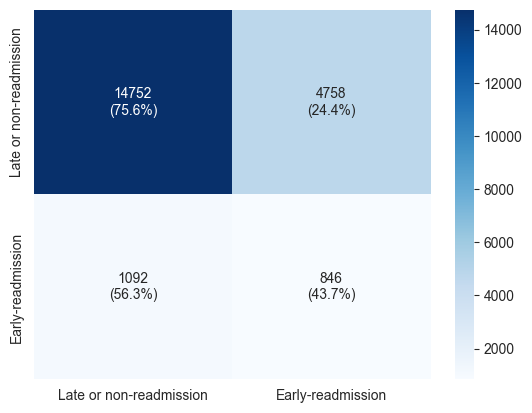

In [60]:
# Visualize confusion matrix with both absolute and percentage values
cm_smote = confusion_matrix(y_test, y_test_pred_smote)
cm_smote_norm = confusion_matrix(y_test, y_test_pred_smote, normalize='true')

annotations_smote = np.array([
    [f"{val}\n({perc:.1%})" for val, perc in zip(row, norm_row)]
    for row, norm_row in zip(cm_smote, cm_smote_norm)
])

sns.heatmap(
    cm_smote,
    annot=annotations_smote,
    cmap='Blues',
    fmt='',
    xticklabels=['Late or non-readmission', 'Early-readmission'],
    yticklabels=['Late or non-readmission', 'Early-readmission']
)

## **5. Optuna Hyper-parameter Tuning | SMOTE + Tomek Links**
Hyper-parameter tuning of the model using Optuna, by oversampling with SMOTE and undersampling with Tomek Links.

### 5.1 Objective & study setup
Preparing the objective function with all hyper-parameters, and creating/loading the Optuna study.

In [61]:
def objective(trial: optuna.Trial) -> float:
    # Hyperparameter search space
    penalty = trial.suggest_categorical("penalty", ["l1", "l2", "elasticnet"])
    params = {
        "loss": trial.suggest_categorical(
            "loss", [
                "hinge",
                "log_loss",
                "modified_huber",
                "squared_hinge",
                "perceptron"
            ]
        ),
        "penalty": penalty,
        "alpha": trial.suggest_float("alpha", 1e-6, 1e-1, log=True),
        "max_iter": trial.suggest_int("max_iter", 100, 20000),
        "tol": trial.suggest_float("tol", 1e-4, 1e-2, log=True),
        "learning_rate": trial.suggest_categorical("learning_rate", ["constant", "optimal", "invscaling", "adaptive"]),
        "eta0": trial.suggest_float("eta0", 1e-4, 1e-1, log=True),
        "early_stopping": True,
        "warm_start": True
    }

    # Add `l1_ratio` only if penalty is "elasticnet"
    if penalty == "elasticnet":
        params["l1_ratio"] = trial.suggest_float("l1_ratio", 0.0, 1.0)
    
    # Build pipeline
    pipeline = make_pipeline(
        SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'), random_state=RANDOM_STATE),
        SGDClassifier(**params, random_state=RANDOM_STATE)
    )
    
    # Define validation folds
    kf = StratifiedKFold(n_splits=5, shuffle=False)
    
    # Cross validation
    scores = cross_val_score(pipeline, X_train, y_train, cv=kf, scoring=SCORING)

    print("Cross validation scores: {}".format(scores))
    print("Average score: {}".format(scores.mean()))

    return scores.mean()

In [62]:
# Set up study with name and storage
storage = JournalStorage(JournalFileBackend(STUDY_PATH_SMOTE_TOMEK))

study = optuna.create_study(
    direction="maximize",
    study_name=STUDY_NAME,
    storage=storage,
    load_if_exists=True,
    sampler=optuna.samplers.TPESampler(constant_liar=True, seed=RANDOM_STATE),
    pruner=optuna.pruners.SuccessiveHalvingPruner()
)

optuna.logging.set_verbosity(optuna.logging.INFO)

c:\Users\alero\.vscode\unibs_mldm_diabetes\.venv\Lib\site-packages\optuna\_experimental.py:31: ExperimentalWarning:

Argument ``constant_liar`` is an experimental feature. The interface can change in the future.

[I 2025-01-16 21:22:53,248] A new study created in Journal with name: Diabetes_130-US


### 5.2 Hyper-parameter tuning
**(CAUTION)** <u>Do not run</u>, unless you already need to find the best parameters. If you already have bound the best model configuration, <u>run the section above</u> _(Objective & study setup)_.

In [63]:
study.optimize(
    objective,
    n_trials=N_TRIALS,
    n_jobs=-1 # Use all available cores
)

[I 2025-01-16 21:24:23,701] Trial 2 finished with value: 0.45141691121848426 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 6.20882849734419e-05, 'max_iter': 5966, 'tol': 0.005437521271904381, 'learning_rate': 'optimal', 'eta0': 0.026858621131024357}. Best is trial 2 with value: 0.45141691121848426.


Cross validation scores: [0.52994279 0.46277666 0.30944684 0.4493383  0.50557996]
Average score: 0.45141691121848426


[I 2025-01-16 21:24:27,291] Trial 6 finished with value: 0.3535223087427272 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 3.1334618398478206e-05, 'max_iter': 17360, 'tol': 0.00018950216403892825, 'learning_rate': 'constant', 'eta0': 0.08085596039221864, 'l1_ratio': 0.2811629614932877}. Best is trial 2 with value: 0.45141691121848426.


Cross validation scores: [0.52826304 0.08283698 0.47666543 0.23986402 0.43998208]
Average score: 0.3535223087427272


[I 2025-01-16 21:24:29,692] Trial 5 finished with value: 0.4533510097845239 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.00023257897487877387, 'max_iter': 9609, 'tol': 0.0003742220760468527, 'learning_rate': 'constant', 'eta0': 0.07674429270897117}. Best is trial 5 with value: 0.4533510097845239.


Cross validation scores: [0.46042839 0.45218406 0.4648406  0.50844435 0.38085764]
Average score: 0.4533510097845239


[I 2025-01-16 21:24:31,579] Trial 0 finished with value: 0.5020560421466123 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 3.074476003090399e-05, 'max_iter': 1244, 'tol': 0.0024766533050916122, 'learning_rate': 'adaptive', 'eta0': 0.000433193006701705}. Best is trial 0 with value: 0.5020560421466123.


Cross validation scores: [0.50335617 0.50245386 0.50737967 0.50129761 0.4957929 ]
Average score: 0.5020560421466123


[I 2025-01-16 21:24:32,077] Trial 4 finished with value: 0.5026244131502965 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.0003184200121790842, 'max_iter': 3928, 'tol': 0.0003835529017632719, 'learning_rate': 'invscaling', 'eta0': 0.00910533040398169}. Best is trial 4 with value: 0.5026244131502965.


Cross validation scores: [0.50329185 0.50046297 0.50752184 0.5051777  0.49666772]
Average score: 0.5026244131502965


[I 2025-01-16 21:24:33,751] Trial 3 finished with value: 0.4812114622259009 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.0016657438773585661, 'max_iter': 5894, 'tol': 0.004757751398345016, 'learning_rate': 'constant', 'eta0': 0.04419020473474418}. Best is trial 4 with value: 0.5026244131502965.


Cross validation scores: [0.52584193 0.48981401 0.50926282 0.41741281 0.46372573]
Average score: 0.4812114622259009


[I 2025-01-16 21:24:35,916] Trial 1 finished with value: 0.5277214186524029 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0008207334649566699, 'max_iter': 1020, 'tol': 0.00017685370804381892, 'learning_rate': 'adaptive', 'eta0': 0.0007270044570480984}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.52434367 0.53731076 0.54147912 0.52075933 0.51471422]
Average score: 0.5277214186524029
Cross validation scores: [0.42969436 0.54864456 0.47632501 0.08292102 0.36435455]
Average score: 0.38038790138948314


[I 2025-01-16 21:24:36,076] Trial 7 finished with value: 0.38038790138948314 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 8.420153718020133e-06, 'max_iter': 10987, 'tol': 0.000696786675882946, 'learning_rate': 'adaptive', 'eta0': 0.0011391905675860491, 'l1_ratio': 0.5983443952832752}. Best is trial 1 with value: 0.5277214186524029.
[I 2025-01-16 21:25:57,998] Trial 8 finished with value: 0.45621811386467365 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.00036068186288588044, 'max_iter': 1673, 'tol': 0.0008773155298635048, 'learning_rate': 'invscaling', 'eta0': 0.013904496292638612}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.45731856 0.43255286 0.49975449 0.40205259 0.48941207]
Average score: 0.45621811386467365


[I 2025-01-16 21:26:01,986] Trial 9 finished with value: 0.2638713156112476 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 0.0032323203802739294, 'max_iter': 5110, 'tol': 0.0002604433840294488, 'learning_rate': 'optimal', 'eta0': 0.004857534534154159, 'l1_ratio': 0.353027147531108}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.47635241 0.08283698 0.08292102 0.27525599 0.40199018]
Average score: 0.2638713156112476


[I 2025-01-16 21:26:05,361] Trial 10 finished with value: 0.37399124486524415 and parameters: {'penalty': 'elasticnet', 'loss': 'perceptron', 'alpha': 2.2040943918311595e-05, 'max_iter': 15307, 'tol': 0.0032853291686426546, 'learning_rate': 'optimal', 'eta0': 0.007351338886803954, 'l1_ratio': 0.2920397361164283}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.52109955 0.08283698 0.37114633 0.40987688 0.48499648]
Average score: 0.37399124486524415


[I 2025-01-16 21:26:13,193] Trial 12 finished with value: 0.45354652859055145 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 0.013623768019574047, 'max_iter': 10656, 'tol': 0.0007024653789499314, 'learning_rate': 'invscaling', 'eta0': 0.0012233280421071004}. Best is trial 1 with value: 0.5277214186524029.
[I 2025-01-16 21:26:13,301] Trial 11 finished with value: 0.5026570215943 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 1.8783101160412827e-05, 'max_iter': 7905, 'tol': 0.0003279737020737046, 'learning_rate': 'adaptive', 'eta0': 0.00015174057452354151}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.45862198 0.44902664 0.45767428 0.45456048 0.44784927]
Average score: 0.45354652859055145
Cross validation scores: [0.50467089 0.50280061 0.50790252 0.50187551 0.49603557]
Average score: 0.5026570215943


[I 2025-01-16 21:26:15,294] Trial 13 finished with value: 0.42694654079094707 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 1.1555536095228872e-06, 'max_iter': 2548, 'tol': 0.0012561381408201654, 'learning_rate': 'optimal', 'eta0': 0.002266747884963143}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.53208793 0.33916512 0.44859146 0.44707655 0.36781164]
Average score: 0.42694654079094707


[I 2025-01-16 21:26:15,641] Trial 15 finished with value: 0.5113385465119805 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 1.9335407732612007e-05, 'max_iter': 18951, 'tol': 0.00021454772906279065, 'learning_rate': 'invscaling', 'eta0': 0.018696159314236706, 'l1_ratio': 0.054693999961563655}. Best is trial 1 with value: 0.5277214186524029.


Cross validation scores: [0.51808062 0.51279997 0.51537731 0.50531611 0.50511872]
Average score: 0.5113385465119805


[I 2025-01-16 21:26:16,119] Trial 14 finished with value: 0.5285669858502953 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0004943049100003153, 'max_iter': 3127, 'tol': 0.00038944682357482704, 'learning_rate': 'optimal', 'eta0': 0.0022546314097544977, 'l1_ratio': 0.15048702292844085}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.53433496 0.53078435 0.54123609 0.51816619 0.51831334]
Average score: 0.5285669858502953


[I 2025-01-16 21:27:39,254] Trial 16 finished with value: 0.5024559609352535 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.004274018805229833, 'max_iter': 9630, 'tol': 0.00205839934684784, 'learning_rate': 'adaptive', 'eta0': 0.0034367677240318834}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.50536809 0.50137337 0.50748757 0.50279146 0.49525932]
Average score: 0.5024559609352535


[I 2025-01-16 21:27:39,678] Trial 17 finished with value: 0.5014608776968096 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.07625058721992266, 'max_iter': 14631, 'tol': 0.00010841808099231948, 'learning_rate': 'adaptive', 'eta0': 0.00011716443667647042}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.50631715 0.49890007 0.50414673 0.50226748 0.49567296]
Average score: 0.5014608776968096


[I 2025-01-16 21:27:42,080] Trial 18 finished with value: 0.4643426518740045 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 0.00012975355337533612, 'max_iter': 180, 'tol': 0.00010314373591068712, 'learning_rate': 'invscaling', 'eta0': 0.00041918269899856783}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.47132692 0.45932081 0.46729622 0.46953819 0.45423112]
Average score: 0.4643426518740045


[I 2025-01-16 21:27:52,231] Trial 19 finished with value: 0.5026857233817779 and parameters: {'penalty': 'l2', 'loss': 'squared_hinge', 'alpha': 3.0854654378444095e-06, 'max_iter': 13831, 'tol': 0.00013715717554742764, 'learning_rate': 'adaptive', 'eta0': 0.00010844238966476404}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.50483753 0.50299377 0.50787642 0.50181167 0.49590922]
Average score: 0.5026857233817779


[I 2025-01-16 21:27:52,563] Trial 22 finished with value: 0.5117447713037968 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.015818495692362083, 'max_iter': 18402, 'tol': 0.0002004314153384859, 'learning_rate': 'invscaling', 'eta0': 0.017674576683213435, 'l1_ratio': 0.91125487977114}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.51580296 0.51016724 0.5198825  0.50619196 0.50667919]
Average score: 0.5117447713037968


[I 2025-01-16 21:27:54,933] Trial 23 finished with value: 0.5276620203244404 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0007492711748659709, 'max_iter': 3411, 'tol': 0.009169101035213128, 'learning_rate': 'optimal', 'eta0': 0.0009419734010686985, 'l1_ratio': 0.009237853097061877}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.51913551 0.53861495 0.52621478 0.53369539 0.52064947]
Average score: 0.5276620203244404
Cross validation scores: [0.50428431 0.50247882 0.50761716 0.50127906 0.49639232]
Average score: 0.5024103331602829


[I 2025-01-16 21:27:55,179] Trial 20 finished with value: 0.5024103331602829 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.0010886188208541006, 'max_iter': 7325, 'tol': 0.0004853850862078289, 'learning_rate': 'adaptive', 'eta0': 0.00027668087879524845}. Best is trial 14 with value: 0.5285669858502953.
[I 2025-01-16 21:27:57,475] Trial 21 finished with value: 0.5026138334993335 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 5.2633194634110135e-06, 'max_iter': 8252, 'tol': 0.0012161541339756673, 'learning_rate': 'adaptive', 'eta0': 0.0002238196523662}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.504542   0.50292938 0.5078377  0.50159813 0.49616195]
Average score: 0.5026138334993335


[I 2025-01-16 21:29:15,772] Trial 24 finished with value: 0.5216501683794621 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.007327123094762932, 'max_iter': 119, 'tol': 0.0005468535589658478, 'learning_rate': 'optimal', 'eta0': 0.001837053612366947, 'l1_ratio': 0.6717884772754117}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.52065096 0.5259497  0.5271987  0.51595657 0.51849492]
Average score: 0.5216501683794621


[I 2025-01-16 21:29:17,572] Trial 25 finished with value: 0.5144441695356419 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.03625615232611428, 'max_iter': 4518, 'tol': 0.0001631104673442014, 'learning_rate': 'optimal', 'eta0': 0.0006338102486246804}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.51515757 0.51439225 0.51807484 0.51502353 0.50957266]
Average score: 0.5144441695356419


[I 2025-01-16 21:29:19,305] Trial 26 finished with value: 0.5262662274269222 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 8.239209890547904e-05, 'max_iter': 12607, 'tol': 0.00027967219035180286, 'learning_rate': 'constant', 'eta0': 0.004669264857450432, 'l1_ratio': 0.16998567135075737}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.5162914  0.53861495 0.53738803 0.51647598 0.52256078]
Average score: 0.5262662274269222


[I 2025-01-16 21:29:30,564] Trial 28 finished with value: 0.4889034573159422 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.01776578371940389, 'max_iter': 16729, 'tol': 0.00014285122452004382, 'learning_rate': 'invscaling', 'eta0': 0.009299456539072567, 'l1_ratio': 0.977667770594702}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.49295487 0.49121839 0.49348181 0.49719281 0.46966942]
Average score: 0.4889034573159422


[I 2025-01-16 21:29:32,647] Trial 27 finished with value: 0.5283042599946655 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.000795179887253802, 'max_iter': 2408, 'tol': 0.0016176411741610562, 'learning_rate': 'optimal', 'eta0': 0.001940668222346855, 'l1_ratio': 0.48326164699598073}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.52005403 0.53861495 0.526127   0.53523167 0.52149365]
Average score: 0.5283042599946655


[I 2025-01-16 21:29:34,819] Trial 29 finished with value: 0.5281380489572808 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0006214571079870017, 'max_iter': 3261, 'tol': 0.007183450728648879, 'learning_rate': 'optimal', 'eta0': 0.0007285304303866008, 'l1_ratio': 0.0246898591252101}. Best is trial 14 with value: 0.5285669858502953.


Cross validation scores: [0.52024783 0.53870048 0.52606012 0.53516329 0.52051852]
Average score: 0.5281380489572808


[I 2025-01-16 21:29:37,076] Trial 30 finished with value: 0.5288553722151692 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0013977890243677645, 'max_iter': 1358, 'tol': 0.0028743962711824107, 'learning_rate': 'optimal', 'eta0': 0.0009295037852767469, 'l1_ratio': 0.000511925570773366}. Best is trial 30 with value: 0.5288553722151692.


Cross validation scores: [0.51893544 0.5382162  0.52748989 0.536346   0.52328934]
Average score: 0.5288553722151692


[I 2025-01-16 21:29:38,870] Trial 31 finished with value: 0.5301183257819311 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0001875776610061349, 'max_iter': 6453, 'tol': 0.004191130472546267, 'learning_rate': 'optimal', 'eta0': 0.0004642759949884925, 'l1_ratio': 0.18736357209859084}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.53941257 0.53406657 0.52601399 0.53491596 0.51618254]
Average score: 0.5301183257819311


[I 2025-01-16 21:30:56,229] Trial 32 finished with value: 0.49842427764925923 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.0027901066626817832, 'max_iter': 3697, 'tol': 0.0004932879934114496, 'learning_rate': 'optimal', 'eta0': 0.0015622077288382033}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.49184753 0.50104265 0.5038994  0.50698514 0.48834668]
Average score: 0.49842427764925923


[I 2025-01-16 21:30:58,535] Trial 34 finished with value: 0.5004310047737006 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 0.0004885821039704384, 'max_iter': 2688, 'tol': 0.008990039971513892, 'learning_rate': 'constant', 'eta0': 0.00037978261672390215}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.49783405 0.50043191 0.50672746 0.50677451 0.4903871 ]
Average score: 0.5004310047737006


[I 2025-01-16 21:30:59,142] Trial 33 finished with value: 0.522196240440971 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 6.0548369986357236e-05, 'max_iter': 5215, 'tol': 0.006720225663462828, 'learning_rate': 'optimal', 'eta0': 0.0027985608716857933, 'l1_ratio': 0.15189005708878234}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.54055731 0.51670457 0.53205112 0.51152237 0.51014583]
Average score: 0.522196240440971


[I 2025-01-16 21:31:10,786] Trial 35 finished with value: 0.5272140985603139 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0018274913694798227, 'max_iter': 6389, 'tol': 0.002175990363053075, 'learning_rate': 'adaptive', 'eta0': 0.0006366756639468666, 'l1_ratio': 0.40250419567400614}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.5252658  0.53438423 0.54321135 0.52030515 0.51290396]
Average score: 0.5272140985603139


[I 2025-01-16 21:31:13,890] Trial 36 finished with value: 0.5294978916133577 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.005702366179763127, 'max_iter': 1620, 'tol': 0.0012744402517519818, 'learning_rate': 'optimal', 'eta0': 0.04600313377579886}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.52051696 0.53582323 0.53884952 0.52975446 0.52254529]
Average score: 0.5294978916133577


[I 2025-01-16 21:31:16,529] Trial 37 finished with value: 0.5277822394135968 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0007018327054904073, 'max_iter': 2759, 'tol': 0.001912375064250736, 'learning_rate': 'optimal', 'eta0': 0.004089218078864497, 'l1_ratio': 0.5293807255848102}. Best is trial 31 with value: 0.5301183257819311.


Cross validation scores: [0.52064849 0.53861495 0.52613512 0.53571353 0.51779912]
Average score: 0.5277822394135968


[I 2025-01-16 21:31:18,709] Trial 38 finished with value: 0.5311354851909124 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0018175075754081212, 'max_iter': 1258, 'tol': 0.0028295760974243966, 'learning_rate': 'optimal', 'eta0': 0.0009235998148227617, 'l1_ratio': 0.020357972922629388}. Best is trial 38 with value: 0.5311354851909124.


Cross validation scores: [0.51920105 0.5409395  0.5404056  0.52706853 0.52806275]
Average score: 0.5311354851909124


[I 2025-01-16 21:31:22,916] Trial 39 finished with value: 0.525586517472971 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00018224208372114015, 'max_iter': 6382, 'tol': 0.004120443906559461, 'learning_rate': 'optimal', 'eta0': 0.0018293835359913405, 'l1_ratio': 0.19769377433241164}. Best is trial 38 with value: 0.5311354851909124.


Cross validation scores: [0.5161733  0.53404613 0.52648512 0.53491596 0.51631207]
Average score: 0.525586517472971


[I 2025-01-16 21:32:35,145] Trial 40 finished with value: 0.5218338678678863 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00029967489425387743, 'max_iter': 4876, 'tol': 0.0016242914542528054, 'learning_rate': 'optimal', 'eta0': 0.0002656327908293816, 'l1_ratio': 0.7513747472291511}. Best is trial 38 with value: 0.5311354851909124.


Cross validation scores: [0.51631123 0.5310544  0.52693852 0.51693022 0.51793497]
Average score: 0.5218338678678863


[I 2025-01-16 21:32:38,427] Trial 41 finished with value: 0.5291616010098285 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00012554315413514422, 'max_iter': 1827, 'tol': 0.0037338989056590406, 'learning_rate': 'optimal', 'eta0': 0.0013955024657319776, 'l1_ratio': 0.12820806975404975}. Best is trial 38 with value: 0.5311354851909124.


Cross validation scores: [0.53948198 0.52973858 0.54095596 0.52264863 0.51298285]
Average score: 0.5291616010098285


[I 2025-01-16 21:32:41,886] Trial 42 finished with value: 0.4777091215158662 and parameters: {'penalty': 'elasticnet', 'loss': 'squared_hinge', 'alpha': 4.475758477553343e-05, 'max_iter': 4048, 'tol': 0.00497262244664693, 'learning_rate': 'optimal', 'eta0': 0.006465055237406959, 'l1_ratio': 0.41899219133564525}. Best is trial 38 with value: 0.5311354851909124.


Cross validation scores: [0.52537958 0.53381137 0.30944684 0.53338814 0.48651968]
Average score: 0.4777091215158662


[I 2025-01-16 21:32:50,092] Trial 43 finished with value: 0.5331083625935019 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0012253646518690755, 'max_iter': 5858, 'tol': 0.001719995218813534, 'learning_rate': 'optimal', 'eta0': 0.000492878968922348, 'l1_ratio': 0.2533447138727716}. Best is trial 43 with value: 0.5331083625935019.


Cross validation scores: [0.51971858 0.54251744 0.53998144 0.5355286  0.52779575]
Average score: 0.5331083625935019


[I 2025-01-16 21:32:59,063] Trial 44 finished with value: 0.44275663165096935 and parameters: {'penalty': 'l2', 'loss': 'log_loss', 'alpha': 0.005138135624313018, 'max_iter': 901, 'tol': 0.0009786465191219012, 'learning_rate': 'constant', 'eta0': 0.058134293691947767}. Best is trial 43 with value: 0.5331083625935019.


Cross validation scores: [0.52556775 0.48165449 0.3666282  0.378787   0.46114571]
Average score: 0.44275663165096935


[I 2025-01-16 21:33:02,895] Trial 45 finished with value: 0.5340332865914343 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.006100774805735545, 'max_iter': 8339, 'tol': 0.002939160102019343, 'learning_rate': 'optimal', 'eta0': 0.02900049214699219}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.52461181 0.54252993 0.54272812 0.52868106 0.53161551]
Average score: 0.5340332865914343


[I 2025-01-16 21:33:05,305] Trial 46 finished with value: 0.3951655127993467 and parameters: {'penalty': 'l2', 'loss': 'perceptron', 'alpha': 0.002250387210802184, 'max_iter': 693, 'tol': 0.002867704174788704, 'learning_rate': 'optimal', 'eta0': 0.000930731537787944}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.40375327 0.3759354  0.47903704 0.38518957 0.33191228]
Average score: 0.3951655127993467


[I 2025-01-16 21:33:07,389] Trial 47 finished with value: 0.5266086519151847 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00861296942811689, 'max_iter': 1810, 'tol': 0.0026233592591750573, 'learning_rate': 'optimal', 'eta0': 0.00016890022935575898, 'l1_ratio': 0.07233150198015126}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.51848395 0.53370034 0.54046854 0.51712533 0.5232651 ]
Average score: 0.5266086519151847


[I 2025-01-16 21:34:14,070] Trial 48 finished with value: 0.5333963671712606 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.0016547780741193972, 'max_iter': 1473, 'tol': 0.004099851222683384, 'learning_rate': 'optimal', 'eta0': 0.002672781292228124, 'l1_ratio': 0.0909900695105259}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.51966314 0.54231937 0.54150791 0.53569566 0.52779575]
Average score: 0.5333963671712606


[I 2025-01-16 21:34:18,427] Trial 49 finished with value: 0.5283653789554374 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00014388492804043095, 'max_iter': 1675, 'tol': 0.0035904033671429357, 'learning_rate': 'optimal', 'eta0': 0.001329448701400998, 'l1_ratio': 0.09803988449489776}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.53955141 0.52616386 0.53735177 0.52258275 0.51617711]
Average score: 0.5283653789554374


[I 2025-01-16 21:34:21,218] Trial 50 finished with value: 0.526685371376381 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00028902117284875623, 'max_iter': 1131, 'tol': 0.00629299344411492, 'learning_rate': 'optimal', 'eta0': 0.000910237922459277, 'l1_ratio': 0.0012099971192249329}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.53927379 0.51863371 0.54194969 0.51745074 0.51611892]
Average score: 0.526685371376381


[I 2025-01-16 21:34:28,278] Trial 51 finished with value: 0.5243061916781984 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.00011164326111083719, 'max_iter': 5971, 'tol': 0.0012419006305907294, 'learning_rate': 'optimal', 'eta0': 0.0005275737082427648, 'l1_ratio': 0.24419421510922518}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.51611374 0.53106698 0.53772532 0.52614753 0.51047738]
Average score: 0.5243061916781984


[I 2025-01-16 21:34:42,825] Trial 52 finished with value: 0.4979129744795152 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.026662225226299897, 'max_iter': 7238, 'tol': 0.0015632526857928676, 'learning_rate': 'optimal', 'eta0': 0.0003487512648365919}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.49975207 0.49705467 0.50738103 0.49023178 0.49514532]
Average score: 0.4979129744795152


[I 2025-01-16 21:34:45,164] Trial 53 finished with value: 0.5086881499260899 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.004297056492691019, 'max_iter': 8707, 'tol': 0.0008124447871771663, 'learning_rate': 'optimal', 'eta0': 0.03506243409273285}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.50835385 0.51599992 0.50883725 0.51270691 0.49754281]
Average score: 0.5086881499260899


[I 2025-01-16 21:34:46,691] Trial 54 finished with value: 0.20819082139844283 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 0.00908049185801542, 'max_iter': 12312, 'tol': 0.002332916505301853, 'learning_rate': 'constant', 'eta0': 0.06276520612163812}. Best is trial 45 with value: 0.5340332865914343.


Cross validation scores: [0.47635241 0.08283698 0.08292102 0.08292102 0.31592267]
Average score: 0.20819082139844283


[I 2025-01-16 21:34:49,189] Trial 55 finished with value: 0.5369197706234331 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05073724868613265, 'max_iter': 9049, 'tol': 0.0031097861569312386, 'learning_rate': 'optimal', 'eta0': 0.0975763950696345}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.52640128 0.53591267 0.55142873 0.54011514 0.53074103]
Average score: 0.5369197706234331


[I 2025-01-16 21:35:53,649] Trial 56 finished with value: 0.5334750509960976 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0012560603988285713, 'max_iter': 10526, 'tol': 0.005582802713252941, 'learning_rate': 'optimal', 'eta0': 0.0005056306240716176}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.51933524 0.54252993 0.54171503 0.53554996 0.5282451 ]
Average score: 0.5334750509960976


[I 2025-01-16 21:35:57,107] Trial 57 finished with value: 0.45606217879596295 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 0.0031206061468392774, 'max_iter': 11673, 'tol': 0.004430332852694926, 'learning_rate': 'invscaling', 'eta0': 0.002792634903781473}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.46104928 0.45559755 0.45931294 0.45588601 0.44846511]
Average score: 0.45606217879596295


[I 2025-01-16 21:35:59,871] Trial 58 finished with value: 0.5310222707184541 and parameters: {'penalty': 'l2', 'loss': 'hinge', 'alpha': 0.0020654722190584784, 'max_iter': 7499, 'tol': 0.002459408011453791, 'learning_rate': 'optimal', 'eta0': 0.027926586311310356}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.51946331 0.53761708 0.54114989 0.53446898 0.52241209]
Average score: 0.5310222707184541


[I 2025-01-16 21:36:08,342] Trial 59 finished with value: 0.5285894086182326 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.006208073702143427, 'max_iter': 5366, 'tol': 0.0018342583501168035, 'learning_rate': 'optimal', 'eta0': 0.015001364965600969, 'l1_ratio': 0.22231433097361764}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.51854256 0.54252993 0.54070735 0.51718919 0.52397802]
Average score: 0.5285894086182326


[I 2025-01-16 21:36:23,643] Trial 60 finished with value: 0.5266922152783047 and parameters: {'penalty': 'elasticnet', 'loss': 'hinge', 'alpha': 0.01225348792180094, 'max_iter': 4135, 'tol': 0.0013507204158056077, 'learning_rate': 'optimal', 'eta0': 0.04870744295577205, 'l1_ratio': 0.30249006191083583}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.51881115 0.53444917 0.54047524 0.51888422 0.5208413 ]
Average score: 0.5266922152783047


[I 2025-01-16 21:36:26,384] Trial 61 finished with value: 0.5340234595539146 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0011546163050383752, 'max_iter': 6830, 'tol': 0.003727576479221995, 'learning_rate': 'optimal', 'eta0': 0.011201555552815833}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.52012739 0.54252993 0.54272812 0.53641994 0.52831192]
Average score: 0.5340234595539146


[I 2025-01-16 21:36:28,313] Trial 62 finished with value: 0.49605999292856584 and parameters: {'penalty': 'l2', 'loss': 'modified_huber', 'alpha': 0.0033320894486752956, 'max_iter': 9754, 'tol': 0.004779377665567126, 'learning_rate': 'optimal', 'eta0': 0.02873475456758506}. Best is trial 55 with value: 0.5369197706234331.


Cross validation scores: [0.46117837 0.51337108 0.50229466 0.50999121 0.49346464]
Average score: 0.49605999292856584


[I 2025-01-16 21:36:29,920] Trial 63 finished with value: 0.5384988822831628 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05616480015522971, 'max_iter': 9158, 'tol': 0.003119682319688542, 'learning_rate': 'optimal', 'eta0': 0.00018682931387116353}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.53132007 0.54315688 0.55160417 0.54009309 0.5263202 ]
Average score: 0.5384988822831628


[I 2025-01-16 21:37:29,177] Trial 64 finished with value: 0.5287651495065875 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0004547444042625252, 'max_iter': 11609, 'tol': 0.005658850671364456, 'learning_rate': 'optimal', 'eta0': 0.006084806748158174}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.51953194 0.53861495 0.54272812 0.52527589 0.51767485]
Average score: 0.5287651495065875


[I 2025-01-16 21:37:32,290] Trial 65 finished with value: 0.5041759250901363 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.0010849631620776523, 'max_iter': 10569, 'tol': 0.00800543878204376, 'learning_rate': 'optimal', 'eta0': 0.09348914472139866}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.50383361 0.52317489 0.50905316 0.48860496 0.49621301]
Average score: 0.5041759250901363


[I 2025-01-16 21:37:33,962] Trial 66 finished with value: 0.5376070433327232 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0978294161523797, 'max_iter': 8077, 'tol': 0.005406020752812687, 'learning_rate': 'invscaling', 'eta0': 0.021656973364578138}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52826304 0.54864456 0.54890494 0.5359983  0.52622438]
Average score: 0.5376070433327232


[I 2025-01-16 21:37:44,352] Trial 67 finished with value: 0.36555241960375207 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 0.025359423075561657, 'max_iter': 10242, 'tol': 0.003173436947568971, 'learning_rate': 'constant', 'eta0': 0.0003064653982431181}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.08283698 0.47635241 0.47632501 0.47632501 0.31592267]
Average score: 0.36555241960375207


[I 2025-01-16 21:38:01,908] Trial 68 finished with value: 0.5336922410165943 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0014395803692242746, 'max_iter': 9212, 'tol': 0.0025526830027091016, 'learning_rate': 'optimal', 'eta0': 0.031739910558724306}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.51960018 0.54252993 0.54272812 0.53529106 0.52831192]
Average score: 0.5336922410165943


[I 2025-01-16 21:38:06,052] Trial 69 finished with value: 0.5311565894396797 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0008682992379597425, 'max_iter': 6991, 'tol': 0.003393131582785823, 'learning_rate': 'optimal', 'eta0': 0.011556125889413946}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.51966577 0.53861495 0.54272812 0.53580925 0.51896486]
Average score: 0.5311565894396797


[I 2025-01-16 21:38:08,462] Trial 70 finished with value: 0.5333942700689727 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0012898366211730376, 'max_iter': 13527, 'tol': 0.004028961144523334, 'learning_rate': 'optimal', 'eta0': 0.022756894668792233}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.51966577 0.54252993 0.54162375 0.53522267 0.52792922]
Average score: 0.5333942700689727


[I 2025-01-16 21:38:10,471] Trial 71 finished with value: 0.5378031075236609 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05110024698032491, 'max_iter': 8889, 'tol': 0.0058440101252998315, 'learning_rate': 'optimal', 'eta0': 0.00020174115642244874}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52763166 0.53724027 0.55135007 0.54011514 0.5326784 ]
Average score: 0.5378031075236609


[I 2025-01-16 21:39:12,542] Trial 72 finished with value: 0.5341691602109779 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.06278733139671415, 'max_iter': 8383, 'tol': 0.003198823071843768, 'learning_rate': 'adaptive', 'eta0': 0.00011803142270340153}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52883977 0.53670493 0.54152049 0.53331555 0.53046506]
Average score: 0.5341691602109779


[I 2025-01-16 21:39:12,896] Trial 73 finished with value: 0.5346724195129522 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.04601574637567952, 'max_iter': 9195, 'tol': 0.0021290479032174403, 'learning_rate': 'optimal', 'eta0': 0.0001446641057368271}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52860909 0.52857891 0.54906027 0.53763271 0.52948112]
Average score: 0.5346724195129522


[I 2025-01-16 21:39:14,364] Trial 74 finished with value: 0.5376070433327232 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0990436248509766, 'max_iter': 7899, 'tol': 0.00518703197928759, 'learning_rate': 'invscaling', 'eta0': 0.00923749162980255}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52826304 0.54864456 0.54890494 0.5359983  0.52622438]
Average score: 0.5376070433327232


[I 2025-01-16 21:39:24,650] Trial 75 finished with value: 0.493933016024525 and parameters: {'penalty': 'l1', 'loss': 'modified_huber', 'alpha': 0.09694500865379597, 'max_iter': 11436, 'tol': 0.00794033780391896, 'learning_rate': 'invscaling', 'eta0': 0.03832309335275081}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.48213988 0.48599025 0.52037488 0.50523633 0.47592373]
Average score: 0.493933016024525


[I 2025-01-16 21:39:44,063] Trial 76 finished with value: 0.5061974764867037 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.034850191684366275, 'max_iter': 9725, 'tol': 0.007368969486078314, 'learning_rate': 'invscaling', 'eta0': 0.020647238065183884}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.51233905 0.49786397 0.50485671 0.51167957 0.50424808]
Average score: 0.5061974764867037


[I 2025-01-16 21:39:47,203] Trial 77 finished with value: 0.48818876121461885 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.02222997635806978, 'max_iter': 9246, 'tol': 0.009727890771558554, 'learning_rate': 'invscaling', 'eta0': 0.012055893498480482}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.49784373 0.48298371 0.49136335 0.48996532 0.47878769]
Average score: 0.48818876121461885


[I 2025-01-16 21:39:50,554] Trial 78 finished with value: 0.5270411340021522 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.012597436911986991, 'max_iter': 10990, 'tol': 0.0043821197376807414, 'learning_rate': 'invscaling', 'eta0': 0.07146223325816743}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52157245 0.53478864 0.53459104 0.52406254 0.520191  ]
Average score: 0.5270411340021522


[I 2025-01-16 21:39:52,915] Trial 79 finished with value: 0.5378918619719666 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05627702336884665, 'max_iter': 8914, 'tol': 0.00594558792953991, 'learning_rate': 'optimal', 'eta0': 0.0002389131728185286}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.53132007 0.54315688 0.55160417 0.53961602 0.52376217]
Average score: 0.5378918619719666


[I 2025-01-16 21:40:56,068] Trial 82 finished with value: 0.47908913299399486 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.0652004449956562, 'max_iter': 7747, 'tol': 0.004985557195452527, 'learning_rate': 'invscaling', 'eta0': 0.00010454164873660212}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.48801719 0.46514956 0.48847537 0.48014807 0.47365549]
Average score: 0.47908913299399486
Cross validation scores: [0.5258644  0.52182949 0.5253961  0.52641239 0.51947991]
Average score: 0.5237964553945348


[I 2025-01-16 21:40:56,308] Trial 80 finished with value: 0.5237964553945348 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.039146818775542415, 'max_iter': 8119, 'tol': 0.003148261401735953, 'learning_rate': 'adaptive', 'eta0': 0.00014076004548431236}. Best is trial 63 with value: 0.5384988822831628.
[I 2025-01-16 21:40:59,648] Trial 81 finished with value: 0.5308711654146545 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05218101072459966, 'max_iter': 8593, 'tol': 0.003668385923289884, 'learning_rate': 'adaptive', 'eta0': 0.00017079040952664156}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.52729637 0.52987819 0.53685559 0.53212707 0.52819861]
Average score: 0.5308711654146545


[I 2025-01-16 21:41:09,833] Trial 83 finished with value: 0.08288740469061441 and parameters: {'penalty': 'l1', 'loss': 'log_loss', 'alpha': 0.0996421946388241, 'max_iter': 8177, 'tol': 0.002008701307539014, 'learning_rate': 'adaptive', 'eta0': 0.0001984412296145948}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.08283698 0.08283698 0.08292102 0.08292102 0.08292102]
Average score: 0.08288740469061441


[I 2025-01-16 21:41:30,935] Trial 84 finished with value: 0.45294423978371573 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.03953407617673771, 'max_iter': 10066, 'tol': 0.002241230226834415, 'learning_rate': 'invscaling', 'eta0': 0.00012946454562125643}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.45707558 0.44680357 0.45842834 0.45465885 0.44775487]
Average score: 0.45294423978371573


[I 2025-01-16 21:41:33,928] Trial 86 finished with value: 0.4509554427415394 and parameters: {'penalty': 'l1', 'loss': 'squared_hinge', 'alpha': 0.046186697583482525, 'max_iter': 8392, 'tol': 0.0031052091269028353, 'learning_rate': 'invscaling', 'eta0': 0.00012453008855346803}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.45579815 0.44643493 0.45630918 0.45127425 0.4449607 ]
Average score: 0.4509554427415394


[I 2025-01-16 21:41:36,767] Trial 85 finished with value: 0.5379014235238255 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.08329646970553221, 'max_iter': 9328, 'tol': 0.005342717417805005, 'learning_rate': 'adaptive', 'eta0': 0.00019068588562053853}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.53036513 0.54864456 0.54890494 0.53426225 0.52733023]
Average score: 0.5379014235238255


[I 2025-01-16 21:41:39,389] Trial 87 finished with value: 0.4733685677075002 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.06099434930214256, 'max_iter': 8750, 'tol': 0.006138898050975598, 'learning_rate': 'invscaling', 'eta0': 0.00014556251953159655}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.48199067 0.46125535 0.48189525 0.47429137 0.4674102 ]
Average score: 0.4733685677075002


[I 2025-01-16 21:42:32,951] Trial 89 finished with value: 0.44943930738494203 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.032045093170526145, 'max_iter': 7779, 'tol': 0.006007702002696987, 'learning_rate': 'invscaling', 'eta0': 0.0002135649232313965}. Best is trial 63 with value: 0.5384988822831628.


Cross validation scores: [0.4540178  0.4443854  0.45458449 0.45069768 0.44351116]
Average score: 0.44943930738494203


[I 2025-01-16 21:42:36,701] Trial 88 finished with value: 0.5389189094885625 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.07391581202322298, 'max_iter': 8957, 'tol': 0.006700688964379053, 'learning_rate': 'adaptive', 'eta0': 0.00023750238625837165}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.53036513 0.55069694 0.55237628 0.53470054 0.52645566]
Average score: 0.5389189094885625
Cross validation scores: [0.52820426 0.53602205 0.54272812 0.53163957 0.520802  ]
Average score: 0.5318791996457187


[I 2025-01-16 21:42:41,434] Trial 90 finished with value: 0.5318791996457187 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.019965010164945077, 'max_iter': 6807, 'tol': 0.005162539745363841, 'learning_rate': 'adaptive', 'eta0': 0.008296703981358823}. Best is trial 88 with value: 0.5389189094885625.
[I 2025-01-16 21:42:45,365] Trial 91 finished with value: 0.46495751784649697 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05486464835689482, 'max_iter': 9606, 'tol': 0.0087124500219247, 'learning_rate': 'invscaling', 'eta0': 0.00010270579722505535}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.47055495 0.45508723 0.47130485 0.46668726 0.4611533 ]
Average score: 0.46495751784649697


[I 2025-01-16 21:43:08,482] Trial 92 finished with value: 0.5314758935224355 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.047044197930465756, 'max_iter': 7541, 'tol': 0.0028145648909461644, 'learning_rate': 'constant', 'eta0': 0.00026398079232370787}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.5259455  0.53206511 0.53773535 0.53572965 0.52590385]
Average score: 0.5314758935224355


[I 2025-01-16 21:43:12,185] Trial 93 finished with value: 0.24029357606279228 and parameters: {'penalty': 'l1', 'loss': 'perceptron', 'alpha': 0.07861106818054829, 'max_iter': 10994, 'tol': 0.004489977539314204, 'learning_rate': 'optimal', 'eta0': 0.00016724069011573288}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.47635241 0.47635241 0.08292102 0.08292102 0.08292102]
Average score: 0.24029357606279228


[I 2025-01-16 21:43:19,318] Trial 94 finished with value: 0.5382001569108683 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.08041057221102897, 'max_iter': 9432, 'tol': 0.005407197043291966, 'learning_rate': 'adaptive', 'eta0': 0.00033962752156046746}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.53036513 0.54917254 0.55024466 0.53470054 0.52651792]
Average score: 0.5382001569108683


[I 2025-01-16 21:43:20,321] Trial 95 finished with value: 0.5248411553609685 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.029065701916595195, 'max_iter': 8959, 'tol': 0.0069622740312787834, 'learning_rate': 'adaptive', 'eta0': 0.00019543963196124678}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.52049204 0.52828507 0.53125222 0.52405353 0.52012291]
Average score: 0.5248411553609685


[I 2025-01-16 21:43:54,632] Trial 96 finished with value: 0.5368606842703505 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.05840857245777941, 'max_iter': 10263, 'tol': 0.007965908657181043, 'learning_rate': 'adaptive', 'eta0': 0.00023956279996498878}. Best is trial 88 with value: 0.5389189094885625.


Cross validation scores: [0.52883977 0.54000876 0.55073509 0.53217541 0.53254438]
Average score: 0.5368606842703505


[I 2025-01-16 21:43:56,149] Trial 97 finished with value: 0.5389650067841357 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.07561653992387103, 'max_iter': 9171, 'tol': 0.006730658691431884, 'learning_rate': 'adaptive', 'eta0': 0.0004220894004020032}. Best is trial 97 with value: 0.5389650067841357.


Cross validation scores: [0.53036513 0.55032211 0.55237628 0.53470054 0.52706097]
Average score: 0.5389650067841357


[I 2025-01-16 21:43:58,719] Trial 98 finished with value: 0.526452933861692 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.01617069727125919, 'max_iter': 8759, 'tol': 0.006388589518499342, 'learning_rate': 'adaptive', 'eta0': 0.00017976299278703396}. Best is trial 97 with value: 0.5389650067841357.


Cross validation scores: [0.52236037 0.53397127 0.53213559 0.52327856 0.52051889]
Average score: 0.526452933861692


[I 2025-01-16 21:43:59,448] Trial 99 finished with value: 0.525522583217259 and parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.042545462496294546, 'max_iter': 7972, 'tol': 0.005657365886506472, 'learning_rate': 'adaptive', 'eta0': 0.0001574947197847655}. Best is trial 97 with value: 0.5389650067841357.


Cross validation scores: [0.52788888 0.52437588 0.52452399 0.52948222 0.52134194]
Average score: 0.525522583217259


In [64]:
print('Best Trial: {}'.format(study.best_trial.number))
print('Best Parameters: {}'.format(study.best_params))
print('Best Value: {}'.format(study.best_value))

Best Trial: 97
Best Parameters: {'penalty': 'l1', 'loss': 'hinge', 'alpha': 0.07561653992387103, 'max_iter': 9171, 'tol': 0.006730658691431884, 'learning_rate': 'adaptive', 'eta0': 0.0004220894004020032}
Best Value: 0.5389650067841357


### 5.3 Optuna Visualizations
Visualizing hyper-parameter tuning results obtained by running Optuna.

In [65]:
optuna.visualization.plot_optimization_history(study)

In [66]:
optuna.visualization.plot_slice(study)

In [67]:
optuna.visualization.plot_param_importances(study)

In [68]:
optuna.visualization.plot_parallel_coordinate(study)

In [69]:
optuna.visualization.plot_contour(study)

In [70]:
optuna.visualization.plot_timeline(study)

### 5.4 Fitting Best Model
Fitting the final model using the best hyper-parameters found by Optuna.

In [71]:
# Fit best model on the training set
best_params = study.best_params

pipeline_smotetomek = make_pipeline(
    SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'), random_state=RANDOM_STATE),
    SGDClassifier(**best_params, random_state=RANDOM_STATE)
)

pipeline_smotetomek.fit(X_train, y_train)

Pipeline(steps=[('smotetomek',
                 SMOTETomek(random_state=38,
                            tomek=TomekLinks(sampling_strategy='majority'))),
                ('sgdclassifier',
                 SGDClassifier(alpha=0.07561653992387103,
                               eta0=0.0004220894004020032,
                               learning_rate='adaptive', max_iter=9171,
                               penalty='l1', random_state=38,
                               tol=0.006730658691431884))])

In [72]:
# Predictions
y_train_pred_smotetomek = pipeline_smotetomek.predict(X_train)
y_test_pred_smotetomek = pipeline_smotetomek.predict(X_test)

In [73]:
ac_train_smotetomek = accuracy_score(y_train, y_train_pred_smotetomek)
ac_test_smotetomek = accuracy_score(y_test, y_test_pred_smotetomek)

print('Train accuracy: ', ac_train_smotetomek)
print('Test accuracy: ', ac_test_smotetomek)

Train accuracy:  0.8508542311919273
Test accuracy:  0.8532264080566953


In [74]:
# Visualize precision, recall, F1-score
print(classification_report(
    y_test, y_test_pred_smotetomek,
    target_names=['Late or non-readmission', 'Early-readmission']
))

                         precision    recall  f1-score   support

Late or non-readmission       0.92      0.92      0.92     19510
      Early-readmission       0.17      0.17      0.17      1938

               accuracy                           0.85     21448
              macro avg       0.55      0.54      0.55     21448
           weighted avg       0.85      0.85      0.85     21448



In [75]:
# Compute precision, recall, F1-score, ROC-AUC-score, and accuracy
recall_smotetomek = recall_score(y_test, y_test_pred_smotetomek, average='macro')
precision_smotetomek = precision_score(y_test, y_test_pred_smotetomek, average='macro')
f1_smotetomek = f1_score(y_test, y_test_pred_smotetomek, average='macro')
roc_auc_smotetomek = roc_auc_score(y_test, y_test_pred_smotetomek, average='macro')
accuracy_smotetomek = accuracy_score(y_test, y_test_pred_smotetomek)

<Axes: >

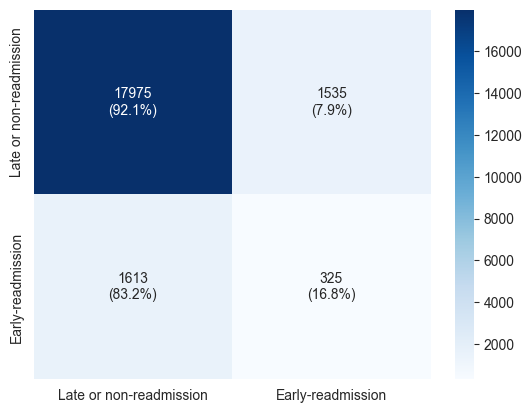

In [76]:
# Visualize confusion matrix with both absolute and percentage values
cm_smotetomek = confusion_matrix(y_test, y_test_pred_smotetomek)
cm_smotetomek_norm = confusion_matrix(y_test, y_test_pred_smotetomek, normalize='true')

annotations_smotetomek = np.array([
    [f"{val}\n({perc:.1%})" for val, perc in zip(row, norm_row)]
    for row, norm_row in zip(cm_smotetomek, cm_smotetomek_norm)
])

sns.heatmap(
    cm_smotetomek,
    annot=annotations_smotetomek,
    cmap='Blues',
    fmt='',
    xticklabels=['Late or non-readmission', 'Early-readmission'],
    yticklabels=['Late or non-readmission', 'Early-readmission']
)

## **6. Results Combined**
Visualizing all results obtained by different sampling methods, on the best respective models.

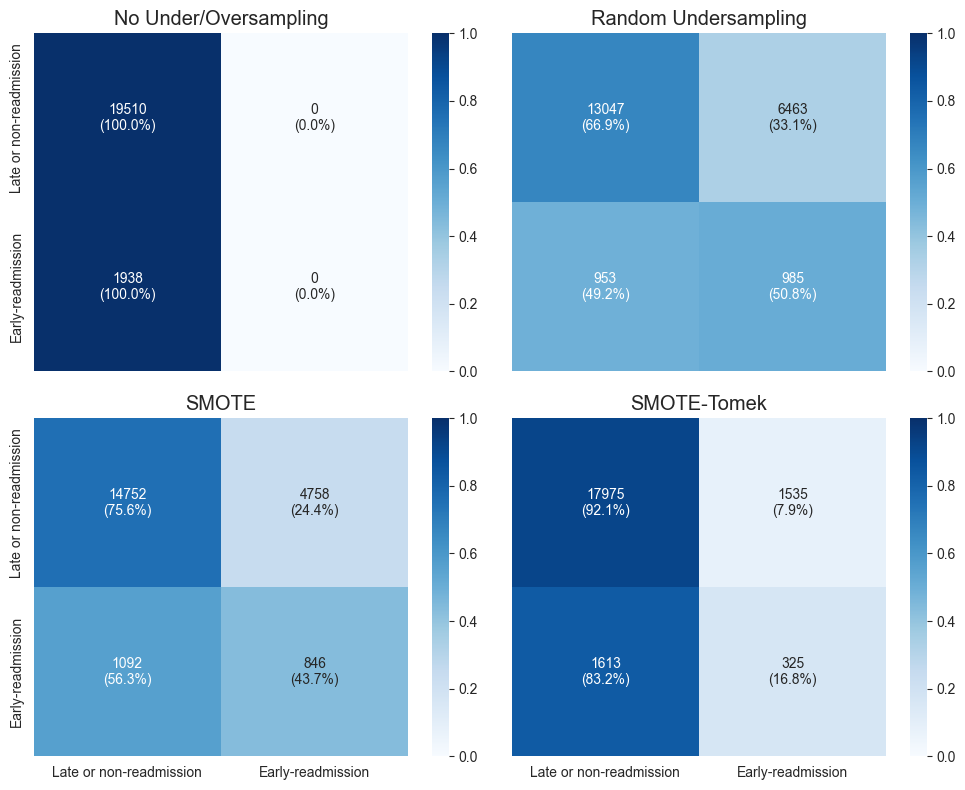

In [77]:
# Combine all confusion matrices into a single plot
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
cm_list = [cm_none_norm, cm_rus_norm, cm_smote_norm, cm_smotetomek_norm]
annotations = [annotations_none, annotations_rus, annotations_smote, annotations_smotetomek]
labels = ['No Under/Oversampling', 'Random Undersampling', 'SMOTE', 'SMOTE-Tomek']

# Define tick labels
xticklabels = ['Late or non-readmission', 'Early-readmission']
yticklabels = ['Late or non-readmission', 'Early-readmission']

for i, cm in enumerate(cm_list):
    ax=axs[i//2, i%2]
    sns.heatmap(
        cm,
        annot=annotations[i],
        cmap='Blues',
        fmt='',
        vmin=0, vmax=1,
        ax=axs[i//2, i%2],
        xticklabels=['Late or non-readmission', 'Early-readmission'],
        yticklabels=['Late or non-readmission', 'Early-readmission']
    )
    ax.set_title(labels[i])
    
    # Hide x-tick labels for the top row
    if i < 2:
        ax.set_xticklabels([])
    # Hide y-tick labels for the right column
    if i % 2 == 1:
        ax.set_yticklabels([])

plt.tight_layout()
plt.show()

Visualizing the scores for each method.

In [78]:
# Combine all metrics into a single DataFrame
data = {
    'Recall': [recall_none, recall_rus, recall_smote, recall_smotetomek],
    'Precision': [precision_none, precision_rus, precision_smote, precision_smotetomek],
    'F1-score': [f1_none, f1_rus, f1_smote, f1_smotetomek],
    'ROC-AUC': [roc_auc_none, roc_auc_rus, roc_auc_smote, roc_auc_smotetomek],
    'Accuracy': [accuracy_none, accuracy_rus, accuracy_smote, accuracy_smotetomek]
}

metrics_df = pd.DataFrame(data, index=labels)
metrics_df

,Recall,Precision,F1-score,ROC-AUC,Accuracy
No Under/Oversampling,0.500000,0.454821,0.476342,0.500000,0.909642
Random Undersampling,0.588495,0.532089,0.494290,0.588495,0.654233
SMOTE,0.596329,0.541021,0.529437,0.596329,0.727247
SMOTE-Tomek,0.544511,0.546192,0.545314,0.544511,0.853226


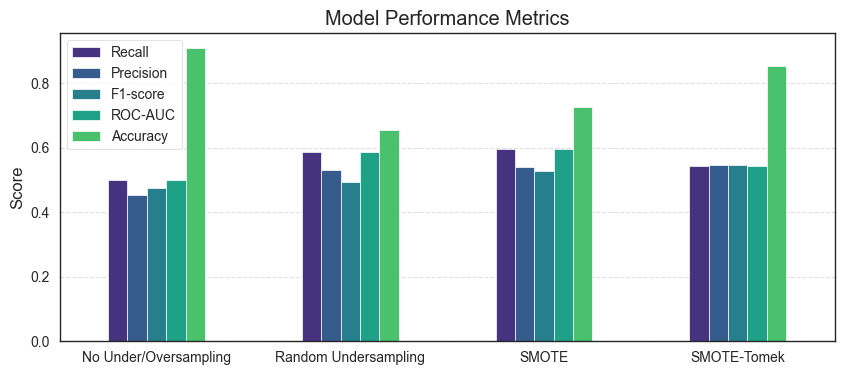

In [79]:
# Visualize all metrics in a bar plot, by coloring each method differently, using SeaBorn barplot and adding grids
sns.set_palette('viridis')
metrics_df.plot(kind='bar', figsize=(10, 4))
plt.title('Model Performance Metrics')
plt.ylabel('Score')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()